* CLIP (Contrastive Language-Image Pretraining) est un modèle développé par OpenAI qui apprend à associer des images et des descriptions textuelles. 
* Pour tester une tâche de classification en 7 catégories en utilisant CLIP pour des textes et des images, l'idée est d'utiliser les représentations encodées par CLIP pour les images et les textes, puis d'entraîner un classificateur sur ces représentations.


**+++ LIENS DE DOCUMENTTIONS**

# IMPORTS LIBRAIRIES

In [4]:
# data & science
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# system & tools
import time
import os
import random

# graphiques
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
from wordcloud import WordCloud
%matplotlib inline

# natural language processing
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer

# computer vision / CNN
from PIL import Image
import cv2 # OpenCV 

# computer vision / CNN
import tensorflow as tf
print("tensorflow", tf.__version__)
# TensorFlow utilise un seul thread pour garantir la reproductibilité
tf.config.threading.set_intra_op_parallelism_threads(1)
tf.config.threading.set_inter_op_parallelism_threads(1)
import keras
print("keras", keras.__version__)
from keras.applications import DenseNet121   



tensorflow 2.16.2
keras 3.6.0


## Reproductibilité des résultats

In [5]:
# Seed value
seed_value= 1802

# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
os.environ['PYTHONHASHSEED']=str(seed_value)
print("os.environ['PYTHONHASHSEED'] == ", os.environ['PYTHONHASHSEED'])

# 2. Set the `python` built-in pseudo-random generator at a fixed value
random.seed(seed_value)

# 3. Set the `numpy` pseudo-random generator at a fixed value
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 

# 5. Configuration spécifique liée à l'utilisation des GPUs
## rapport de bug : "GPU MaxPool gradient ops do not yet have a deterministic XLA implementation" https://github.com/tensorflow/tensorflow/issues/69417
## I have the same problem about MaxPooling2D. The following tutorial about reproducibility of keras confirmed that the same error occurs: https://keras.io/examples/keras_recipes/reproducibility_recipes/
## I wrote this guide when Keras had jit_compile = None (Keras 2 or tf-keras) in the compile method. Now, Keras 3 uses jit_compile = "auto" (trying to use XLA) for the TensorFlow backend, which is the root of the error.
## You can simply pass jit_compile = False if you're using Keras 3.
tf.config.experimental.enable_op_determinism() # se trouve dans la partie API expérimental (call temporaire) depuis juin 2024, remplace os.environ['TF_DETERMINISTIC_OPS']  
# => dans modele.compile mettre jit_compile=False "just in time compiler"

# 6. Vérifier la reproductibilité
random_values_1 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 1:", random_values_1.numpy())
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_2 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 2:", random_values_2.numpy())
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "TF/KERAS Les valeurs aléatoires ne sont pas identiques"
print("TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

os.environ['PYTHONHASHSEED'] ==  1802
TF/KERAS Valeurs aléatoires 1: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Valeurs aléatoires 2: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.


#  DATA
* charger et préparer les données

In [6]:
data_0 = pd.read_csv("./Flipkart/flipkart_com-ecommerce_sample_1050.csv")
data_0.info()
display(data_0.tail(1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


### Les catégories principales

In [7]:
# Séparation de la catégorie principale et de ses sous-catégories
def extract_categories(row):
    categories = row.strip('["]').split(' >> ')
    categ_0 = categories[0]
    sub_categories = ' '.join(categories[1:]) 
    return categ_0, sub_categories
# Fonction pour obtenir les dimensions des images
def get_image_dimensions(image_path):
    image = cv2.imread(image_path)
    if image is not None:
        height, width, _ = image.shape
        return height, width
    else:
        return None, None  

In [8]:
prep_data = data_0.filter(['uniq_id', 'product_name', 'description', 'product_category_tree', 'image'])
# extraire la catégorie principale et les sous-catégories regroupées
prep_data[['categ_0', 'sub_categories']] = prep_data['product_category_tree'].apply(lambda x: pd.Series(extract_categories(x)))
prep_data['categ_0'] = prep_data['categ_0'].str.lower()
prep_data.tail(5)

,uniq_id,product_name,description,product_category_tree,image,categ_0,sub_categories
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker,Oren Empower Extra Large Self Adhesive Sticker...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",958f54f4c46b53c8a0a9b8167d9140bc.jpg,baby care,Baby & Kids Gifts Stickers Oren Empower Stickers
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker,Wallmantra Large Vinyl Sticker Sticker (Pack o...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",fd6cbcc22efb6b761bd564c28928483c.jpg,baby care,Baby & Kids Gifts Stickers Wallmantra Stickers
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5912e037d12774bb73a2048f35a00009.jpg,baby care,Baby & Kids Gifts Stickers Uberlyfe Stickers
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Medium Vinyl Sticker Sticker,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,baby care,Baby & Kids Gifts Stickers Wallmantra Stickers
1049,f2f027ad6a6df617c9f125173da71e44,Uberlyfe Large Vinyl Sticker,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",f2f027ad6a6df617c9f125173da71e44.jpg,baby care,Baby & Kids Gifts Stickers Uberlyfe Stickers


In [9]:
# encoder le nom des catéories principales
le = LabelEncoder()
le.fit(prep_data["categ_0"])
prep_data["label"] = le.transform(prep_data["categ_0"])
prep_data.head(2)

,uniq_id,product_name,description,product_category_tree,image,categ_0,sub_categories,label
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Curtains & Accessories Curtains Elegance Polye...,4
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Baby Bath & Skin Baby Bath Towels Sathiyas Bab...,0


In [10]:
label_to_category = {label: category for label, category in enumerate(le.classes_)}
label_to_category

{0: 'baby care',
 1: 'beauty and personal care',
 2: 'computers',
 3: 'home decor & festive needs',
 4: 'home furnishing',
 5: 'kitchen & dining',
 6: 'watches'}

### Les descriptions
* S'assurer que toutes les descriptions sont en anglais, en regardant la présence de stopwords en anglais dans les textes.

In [11]:
# Télécharger les stop words
nltk.download('stopwords')
# Charger les stop words en anglais
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/stephanie/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
# Fonction pour vérifier l'absence de stop words en anglais dans les descriptions
def sans_stopwords_anglais(text):
    words = text.split()
    return not any(word.lower() in stop_words for word in words)

# Filtrer les descriptions qui ne contiennent pas de stop words en anglais
filtered_data = prep_data[prep_data['description'].apply(sans_stopwords_anglais)]

# Afficher les descriptions qui ne contiennent pas de stop words en anglais
pd.set_option('display.max_colwidth', None)
print(filtered_data[['description']])


                                                                                                                                                                                                       description
89                     Parv Collections Showpiece  -  12 cm (Polyresin, Multicolor)\r\n                         Price: Rs. 1,085\r\n\t\t\t\t\r\n\t\t\tLovely Sitting Couple Statue\r\nLovely Sitting Couple Statue
116  Recrafto Buddha Showpiece  -  15.24 cm (Brass, Black, Green)\r\n                         Price: Rs. 3,500\r\n\t\t\t\t\r\n\t\t\tRecrafto Brass Buddha Religious Idols\r\nRecrafto Brass Buddha Religious Idols
267                              Sahara Q Shop Kadhai 1.5 L (Stainless Steel)\r\n                         Price: Rs. 650\r\n\t\t\t\t\r\n\t\t\tPremium Non Stick Kadhai 1.5.Ltr\r\nPremium Non Stick Kadhai 1.5.Ltr
599                                                                                Next Steps Baby Girl's Layered Dress\r\n                         Price: R

* sur l'ensemble des données il n'y a que 6 descriptions qui ne contiennent pas de stopwords en anglais.
* il s'agit de rares exemples d'annonces très peu "verbeuses", écrites de manière très descriptives sans fioritures marketing. Ces textes sont néanmoins bel et bien anglais.
* Nous pouvons affirmer que l'ensemble des textes est bien rédigé en anlgais. 

**Échantillons de descriptions par catégories**

In [13]:
random_samples = prep_data.groupby('categ_0').apply(lambda x: x.sample(1, random_state=seed_value)).reset_index(drop=True)
for index, row in random_samples.iterrows():
    print(f" Exemple de description pour la catégorie ** {row['categ_0']} ** \n {row['description']} \n")

 Exemple de description pour la catégorie ** baby care ** 
 Key Features of cherry crumble california Baby Boy's Dungaree Fabric: 100% Cotton Brand Color: Grey Olive Camouflage,Specifications of cherry crumble california Baby Boy's Dungaree Top Details Fabric 100% Cotton Type Dungaree General Details Pattern Printed Ideal For Baby Boy's 

 Exemple de description pour la catégorie ** beauty and personal care ** 
 Vincent Valentine Paris Set of Dark Fire, Dark Fire & Majesty Deodorants Combo Set (Set of 3)
                         Price: Rs. 389
				
			Dark Fire sparkles with an enchanting top note blend of Black Currant and Star Anise. The distinctive spiciness is embraced by Galanga Root for depth and Green Pepper extract for warmth. The base is rich and woody with Balsam, Cedar entwined with Vanilla Beans. 
Passionate and royal, majesty, the latest beautiful perfume from Anna Andre distinguishes itself from all others. It pampers the young and extravagant woman with a neo-classical t

/tmp/ipykernel_911805/1082872909.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  random_samples = prep_data.groupby('categ_0').apply(lambda x: x.sample(1, random_state=seed_value)).reset_index(drop=True)


In [14]:
# relimiter l'affichage des colonnes
pd.reset_option('display.max_colwidth')

**Longueur des textes**

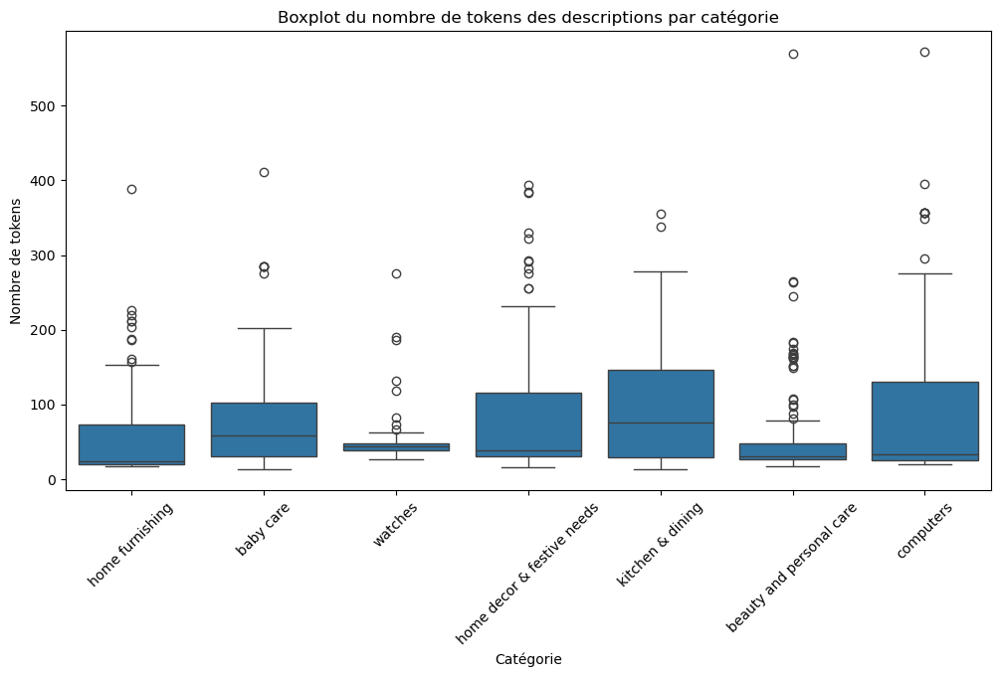

In [15]:
# Test de tokenisation 
# \b\w*[a-zA-Z]+\w*\b correspond aux mots et aux chiffres collés à des lettres, sans les ponctuations
# \b[a-zA-Z]+\b correspond aux mots seuls, les chiffres sans lettres sont exclus    
tokenizer = RegexpTokenizer(r'\b\w*[a-zA-Z]+\w*\b|\b[a-zA-Z]+\b')

# Fonction pour compter le nombre de tokens dans une description
def count_tokens(text):
    tokens = tokenizer.tokenize(text)
    return len(tokens)

prep_data['token_count'] = prep_data['description'].apply(count_tokens)

# boxplot par catégories
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='categ_0', y='token_count', data=prep_data)
plt.title('Boxplot du nombre de tokens des descriptions par catégorie')
plt.xlabel('Catégorie')
plt.xticks(rotation=45)
plt.ylabel('Nombre de tokens')
plt.show()

In [16]:
# Calculer la moyenne et la médiane pour chaque catégorie
mean_median_data = prep_data.groupby('categ_0')['token_count'].agg(['mean', 'median', 'max', 'min']).reset_index()
mean_median_data

,categ_0,mean,median,max,min
0,baby care,78.086667,58.0,411,13
1,beauty and personal care,56.940000,31.0,570,18
2,computers,84.860000,33.0,572,20
3,home decor & festive needs,85.160000,39.0,394,16
4,home furnishing,57.473333,24.0,389,18
5,kitchen & dining,99.793333,75.5,355,14
6,watches,47.966667,43.5,276,27


* après une tokenisation des descriptions faite avec le RegexpTokenizer de nltk, on observe qu'une bonne partie de nos textes sont plus longs que ceux ayant servis à l'entraînement de CLIP 
* Le modèle CLIP (Contrastive Language-Image Pretraining) a été entraîné par OpenAI sur un vaste ensemble de données appelé WebImageText (WIT). 
* En effet, le modèle CLIP a été pré-entraîné avec une longueur de contexte spécifique (77 tokens), et changer cette longueur peut affecter les performances du modèle.
* normalement il n'est pas nécessaire de tokeniser les textes avant de les envoyer à CLIP, car il a son propre tokenisateur.
* nous allons néanmoins essayer de maximiser la qualité de l'information envoyée, en réduisant les mots moins utiles, nous verrons si cela améliore les performancesde CLIP.
* nous allons donc tester 2 approches :
    1. en lui envoyant les textes tokenisés avec le RegexpTokenizer de nltk pour supprimer un maximum de mots peu utiles, puis tronquer les textes à 77 tokens en utilisant la tokenisation de CLIP.
    2. en lui envoyant les textes non tokenisés et juste tronquer les textes à 77 tokens en utilisant la tokenisation de CLIP.


In [17]:
tokenizer = RegexpTokenizer(r'\b\w*[a-zA-Z]+\w*\b|\b[a-zA-Z]+\b')


# Fonction pour compter le nombre de tokens dans une description
def len_text(text):
    return len(text)

# Fonction pour compter le nombre de tokens dans une description
def count_tokens(text):
    tokens = tokenizer.tokenize(text)
    return len(tokens)

# Fonction pour l'approche 1 : Tokeniser avec NLTK, puis tronquer avec CLIP
def approach_nltk(text):
    # Tokeniser avec NLTK
    tokens = tokenizer.tokenize(text)
    #truncated_tokens = tokens[:max_length]
    token_string = ' '.join(tokens)

    return token_string


In [18]:
prep_data['len_text'] = prep_data['description'].apply(len_text)
prep_data['token_nltk'] = prep_data['description'].apply(approach_nltk)
prep_data['token_nltk_len'] = prep_data['token_nltk'].apply(len_text)
prep_data['token_nltk_count'] = prep_data['token_nltk'].apply(count_tokens)

prep_data.head(2)

,uniq_id,product_name,description,product_category_tree,image,categ_0,sub_categories,label,token_count,len_text,token_nltk,token_nltk_len,token_nltk_count
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Curtains & Accessories Curtains Elegance Polye...,4,226,1420,Key Features of Elegance Polyester Multicolor ...,1373,226
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Baby Bath & Skin Baby Bath Towels Sathiyas Bab...,0,68,444,Specifications of Sathiyas Cotton Bath Towel B...,418,68


In [19]:
token_nltk_count = prep_data.groupby('categ_0')['token_nltk_count'].agg(['mean', 'median', 'max', 'min']).reset_index()
token_nltk_count

,categ_0,mean,median,max,min
0,baby care,78.086667,58.0,411,13
1,beauty and personal care,56.940000,31.0,570,18
2,computers,84.860000,33.0,572,20
3,home decor & festive needs,85.160000,39.0,394,16
4,home furnishing,57.473333,24.0,389,18
5,kitchen & dining,99.793333,75.5,355,14
6,watches,47.966667,43.5,276,27


In [20]:
text_truncated_count = prep_data.groupby('categ_0')['token_count'].agg(['mean', 'median', 'max', 'min']).reset_index()
text_truncated_count

,categ_0,mean,median,max,min
0,baby care,78.086667,58.0,411,13
1,beauty and personal care,56.940000,31.0,570,18
2,computers,84.860000,33.0,572,20
3,home decor & festive needs,85.160000,39.0,394,16
4,home furnishing,57.473333,24.0,389,18
5,kitchen & dining,99.793333,75.5,355,14
6,watches,47.966667,43.5,276,27


**Échantillons de descriptions tronquées par catégories**

In [21]:
random_samples = prep_data.groupby('categ_0').apply(lambda x: x.sample(1, random_state=seed_value)).reset_index(drop=True)
for index, row in random_samples.iterrows():
    print(f" Exemple de description pour la catégorie ** {row['categ_0']} ** \n Longueur token_nltk : {len(row['token_nltk'])} \n {row['token_nltk']} \n")

 Exemple de description pour la catégorie ** baby care ** 
 Longueur token_nltk : 266 
 Key Features of cherry crumble california Baby Boy s Dungaree Fabric Cotton Brand Color Grey Olive Camouflage Specifications of cherry crumble california Baby Boy s Dungaree Top Details Fabric Cotton Type Dungaree General Details Pattern Printed Ideal For Baby Boy s 

 Exemple de description pour la catégorie ** beauty and personal care ** 
 Longueur token_nltk : 973 
 Vincent Valentine Paris Set of Dark Fire Dark Fire Majesty Deodorants Combo Set Set of Price Rs Dark Fire sparkles with an enchanting top note blend of Black Currant and Star Anise The distinctive spiciness is embraced by Galanga Root for depth and Green Pepper extract for warmth The base is rich and woody with Balsam Cedar entwined with Vanilla Beans Passionate and royal majesty the latest beautiful perfume from Anna Andre distinguishes itself from all others It pampers the young and extravagant woman with a neo classical touch Dark 

/tmp/ipykernel_911805/2132760375.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  random_samples = prep_data.groupby('categ_0').apply(lambda x: x.sample(1, random_state=seed_value)).reset_index(drop=True)


**Fréquences des tokens uniques par catégories**

In [22]:
# fréquence des tokens uniques dans les descriptions des articles par catégorie principale
token_frequencies = {}

for _, row in prep_data.iterrows():
    categ_0 = row['categ_0']
    description = row['description']
    
    tokens = tokenizer.tokenize(description)
    if categ_0 not in token_frequencies:
        token_frequencies[categ_0] = {}
    
    for token in tokens:
        if token not in token_frequencies[categ_0]:
            token_frequencies[categ_0][token] = 0
        token_frequencies[categ_0][token] += 1

freq_data = []
for categ_0, tokens in token_frequencies.items():
    for token, freq in tokens.items():
        freq_data.append({'categ_0': categ_0, 'token': token, 'frequency': freq})

descript_freq_df = pd.DataFrame(freq_data)
descript_freq_df.rename(columns={'token': 'descript_tokens'}, inplace=True)
descript_freq_df

,categ_0,descript_tokens,frequency
0,home furnishing,Key,32
1,home furnishing,Features,52
2,home furnishing,of,296
3,home furnishing,Elegance,4
4,home furnishing,Polyester,56
...,...,...,...
11052,computers,me,4
11053,computers,looking,4
11054,computers,upwards,4
11055,computers,Red,4


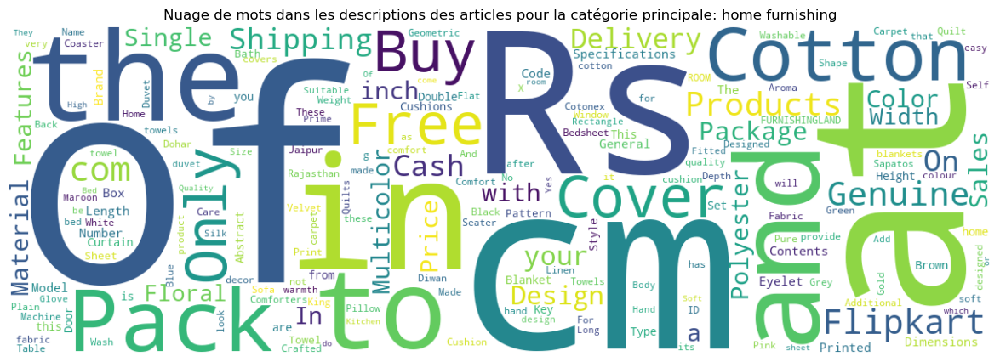

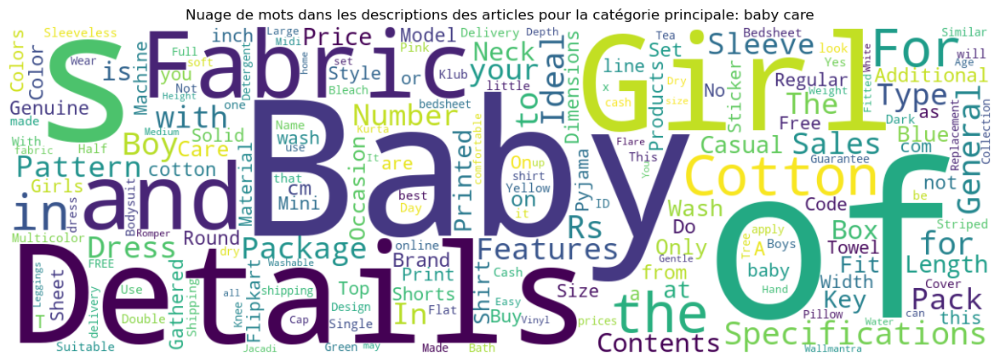

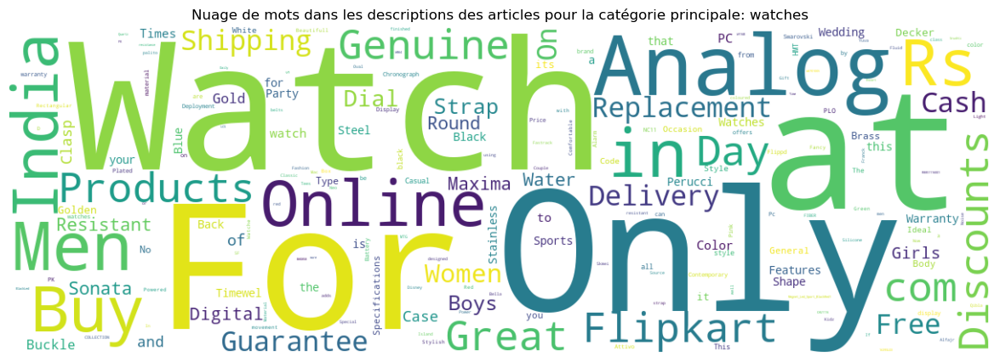

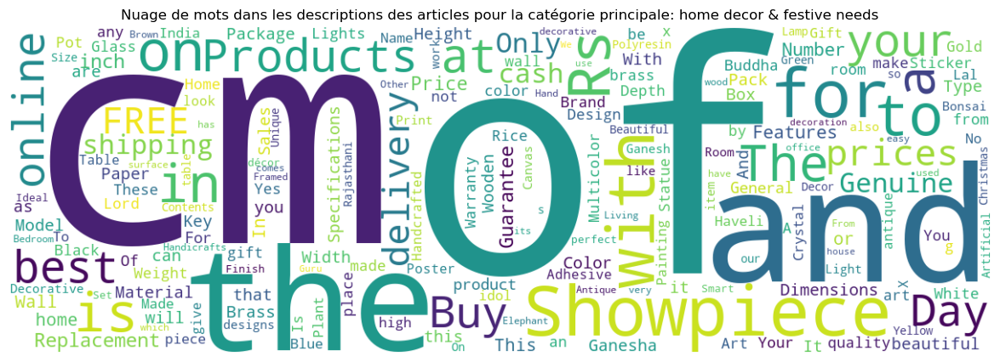

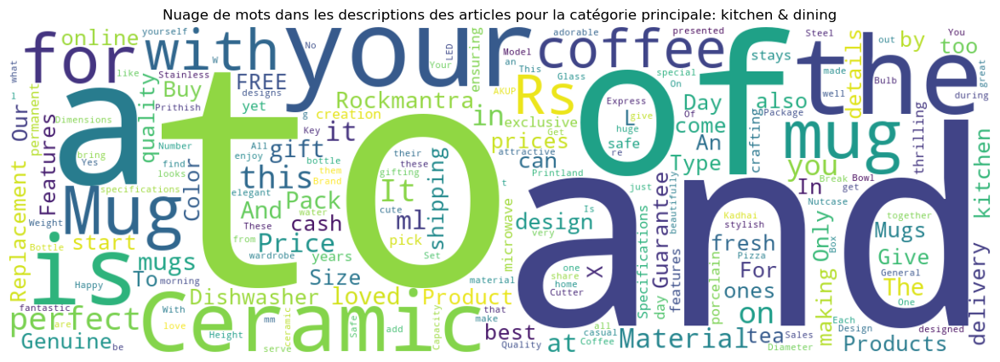

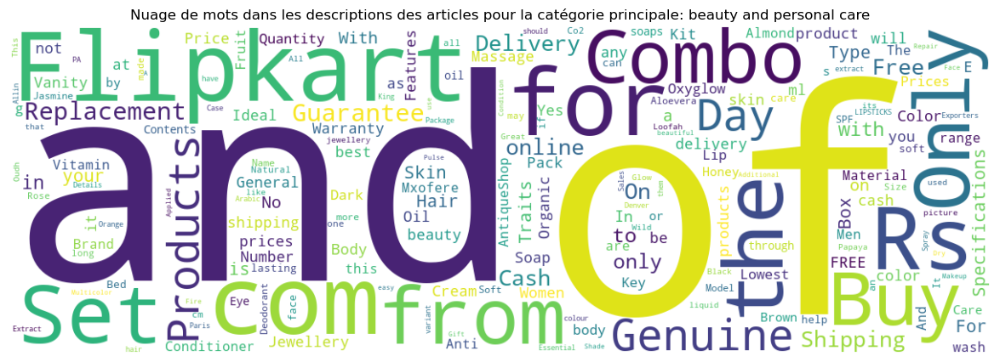

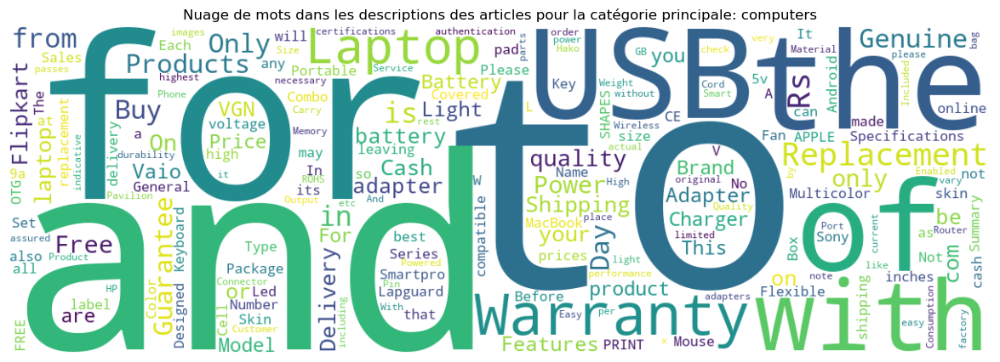

In [23]:
for categ_0 in descript_freq_df['categ_0'].unique():
    # Filtrer les tokens pour la catégorie principale actuelle
    tokens = descript_freq_df[descript_freq_df['categ_0'] == categ_0]
    
    # Créer un dictionnaire de fréquences pour WordCloud
    token_dict = dict(zip(tokens['descript_tokens'], tokens['frequency']))
    
    # Générer le nuage de mots
    wordcloud = WordCloud(width=1200, height=400, background_color='white').generate_from_frequencies(token_dict)
    
    # Afficher le nuage de mots
    plt.figure(figsize=(20, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Nuage de mots dans les descriptions des articles pour la catégorie principale: {categ_0}')
    plt.axis('off')
    plt.show()

### Les images

In [24]:
# récupérer les chemins vers les fichiers images
path_images = "./Flipkart/Images/"
prep_data['image_path'] = path_images + prep_data['image']
# obtenir les dimensions des images d'origines
prep_data['height_origin'], prep_data['width_origin'] = zip(*prep_data['image_path'].apply(get_image_dimensions))
prep_data.head(2)

[ WARN:0@624.644] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/41384da51732c0b4df3de8f395714fbb.jpg'): can't open/read file: check file path/integrity
[ WARN:0@624.730] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/b52073e7ed9c00c4108cae4eb0c49c1a.jpg'): can't open/read file: check file path/integrity
[ WARN:0@624.847] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/2d50e4c6ccf8befe9335ac8f97a11712.jpg'): can't open/read file: check file path/integrity
[ WARN:0@625.437] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/46e6853da6b0c796b7a0d8203ceaa88e.jpg'): can't open/read file: check file path/integrity
[ WARN:0@627.359] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/9833d0de7f7e1927c807411c10b19189.jpg'): can't open/read file: check file path/integrity
[ WARN:0@627.619] global loadsave.cpp:248 findDecoder imread_('./Flipkart/Images/4d2e9f36823bad0f6fe8c6b19bb92bdb.jpg'): can't open/read file: check file p

,uniq_id,product_name,description,product_category_tree,image,categ_0,sub_categories,label,token_count,len_text,token_nltk,token_nltk_len,token_nltk_count,image_path,height_origin,width_origin
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Curtains & Accessories Curtains Elegance Polye...,4,226,1420,Key Features of Elegance Polyester Multicolor ...,1373,226,./Flipkart/Images/55b85ea15a1536d46b7190ad6fff...,3600.0,3600.0
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Baby Bath & Skin Baby Bath Towels Sathiyas Bab...,0,68,444,Specifications of Sathiyas Cotton Bath Towel B...,418,68,./Flipkart/Images/7b72c92c2f6c40268628ec5f14c6...,1293.0,2388.0


**Taille des images**

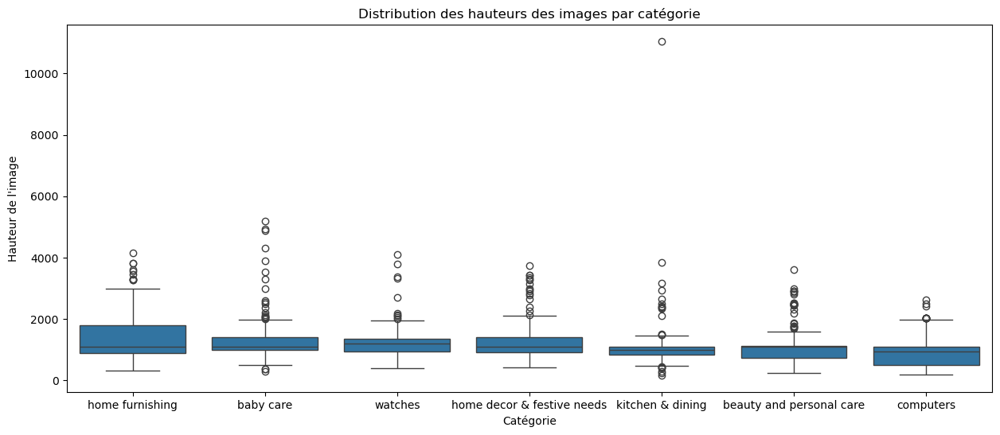

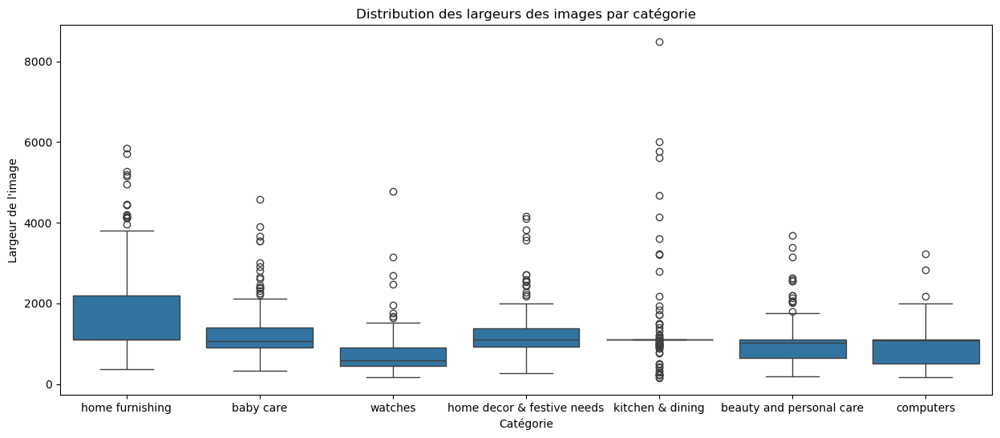

In [25]:
# box plot pour les hauteurs des images par catégorie
plt.figure(figsize=(15, 6))
sns.boxplot(x='categ_0', y='height_origin', data=prep_data)
plt.title('Distribution des hauteurs des images par catégorie')
plt.xlabel('Catégorie')
plt.ylabel('Hauteur de l\'image')
plt.show()

# box plot pour les largeurs des images par catégorie
plt.figure(figsize=(15, 6))
sns.boxplot(x='categ_0', y='width_origin', data=prep_data)
plt.title('Distribution des largeurs des images par catégorie')
plt.xlabel('Catégorie')
plt.ylabel('Largeur de l\'image')
plt.show()

* les dimensions des images ne sont pas uniformes, même au sein de chaque catégorie (en particulier pour la catégorie kitchen&dining)
* il faudra prévoir dans le processus de prétraitement des images un redimensionnement pour normer les tailles des images, car les CNN notamment nécessitent d'avoir des données en entrée de même dimensions

In [26]:
# Initialiser la colonne 'processed_image' avec des valeurs None
prep_data['reshaped_image_path'] = None

# Créer un répertoire pour stocker les images traitées
output_dir = './reshaped_images'
os.makedirs(output_dir, exist_ok=True)

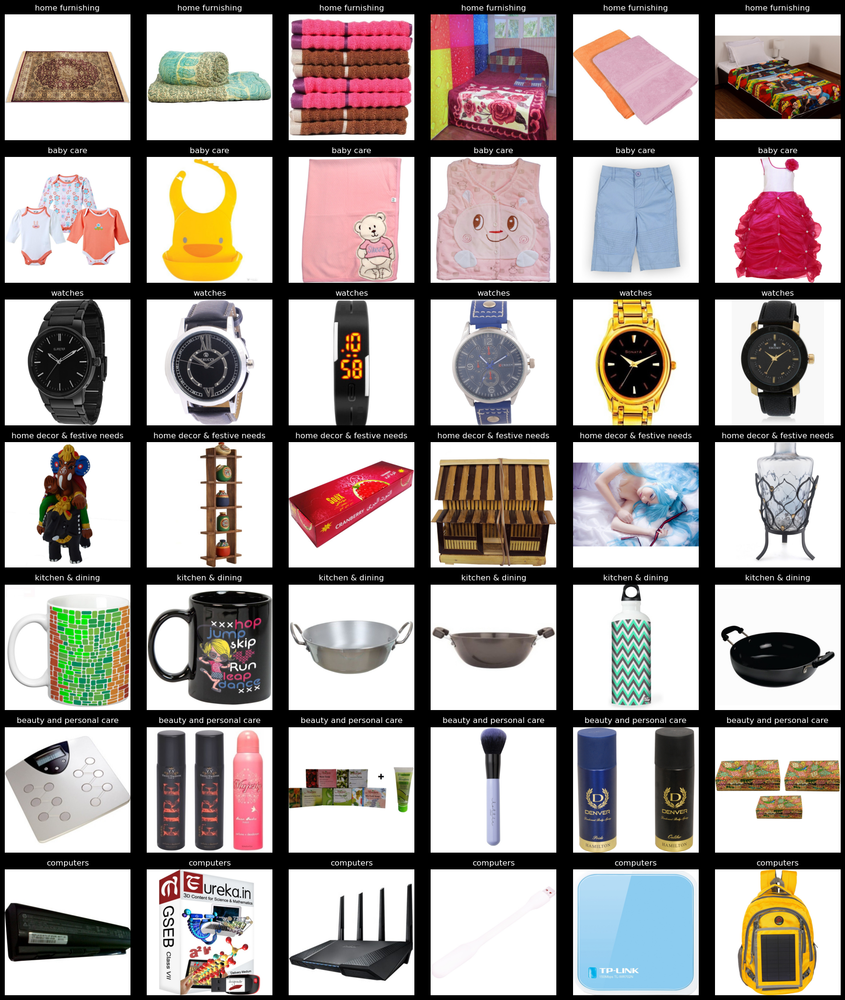

In [27]:
# Fonction pour obtenir des images carrées, avec la dimension la plus petite compléter avec des pixels blancs
def pad_image_to_square(image):
    h, w = image.shape[:2]
    if h > w:
        pad = h - w
        padded_image = cv2.copyMakeBorder(image, 0, 0, pad // 2, pad - pad // 2, cv2.BORDER_CONSTANT, value=[255, 255, 255])
    elif w > h:
        pad = w - h
        padded_image = cv2.copyMakeBorder(image, pad // 2, pad - pad // 2, 0, 0, cv2.BORDER_CONSTANT, value=[255, 255, 255])
    else:
        padded_image = image
    return padded_image

# Traiter les images, les sauvegarder et mettre à jour le chemin des images traitées dans le DataFrame
for index, row in prep_data.iterrows():
    image_path = row['image_path']
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    padded_img = pad_image_to_square(img)
    output_path = os.path.join(output_dir, os.path.basename(image_path))
    cv2.imwrite(output_path, cv2.cvtColor(padded_img, cv2.COLOR_RGB2BGR))
    prep_data.at[index, 'reshaped_image_path'] = output_path

# Afficher un échantillon de 6 images aléatoires dans chaque catégorie après le traitement
categories = prep_data['categ_0'].unique()
fig, axes = plt.subplots(len(categories), 6, figsize=(18, len(categories) * 3), facecolor='black')

for i, category in enumerate(categories):
    category_images = prep_data[prep_data['categ_0'] == category]['reshaped_image_path']
    sampled_images = random.sample(list(category_images), min(6, len(category_images)))
    
    for j, image_path in enumerate(sampled_images):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = axes[i, j] if len(categories) > 1 else axes[j]
        ax.imshow(img)
        ax.set_title(f'{category}', color='white')
        ax.axis('off')

plt.tight_layout()
plt.show()

In [28]:
# Ajouter les dimensions des images mises au carré pour vérification
prep_data['reshaped_height'], prep_data['reshaped_width'] = zip(*prep_data['reshaped_image_path'].apply(get_image_dimensions))
prep_data.head(3)

,uniq_id,product_name,description,product_category_tree,image,categ_0,sub_categories,label,token_count,len_text,token_nltk,token_nltk_len,token_nltk_count,image_path,height_origin,width_origin,reshaped_image_path,reshaped_height,reshaped_width
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Curtains & Accessories Curtains Elegance Polye...,4,226,1420,Key Features of Elegance Polyester Multicolor ...,1373,226,./Flipkart/Images/55b85ea15a1536d46b7190ad6fff...,3600.0,3600.0,./reshaped_images/55b85ea15a1536d46b7190ad6fff...,3600,3600
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Baby Bath & Skin Baby Bath Towels Sathiyas Bab...,0,68,444,Specifications of Sathiyas Cotton Bath Towel B...,418,68,./Flipkart/Images/7b72c92c2f6c40268628ec5f14c6...,1293.0,2388.0,./reshaped_images/7b72c92c2f6c40268628ec5f14c6...,2388,2388
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,baby care,Baby Bath & Skin Baby Bath Towels Eurospa Baby...,0,199,1258,Key Features of Eurospa Cotton Terry Face Towe...,1167,199,./Flipkart/Images/64d5d4a258243731dc7bbb1eef49...,729.0,982.0,./reshaped_images/64d5d4a258243731dc7bbb1eef49...,982,982


### Dataset final

In [29]:
# sélection du dataset préparé pour l'approche CLIP
data_final = prep_data.filter(['uniq_id', 'product_name', 'description', 'token_nltk', 'categ_0', 'label', 'reshaped_image_path'])
data_final.head(2)

,uniq_id,product_name,description,token_nltk,categ_0,label,reshaped_image_path
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Key Features of Elegance Polyester Multicolor ...,home furnishing,4,./reshaped_images/55b85ea15a1536d46b7190ad6fff...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Specifications of Sathiyas Cotton Bath Towel B...,baby care,0,./reshaped_images/7b72c92c2f6c40268628ec5f14c6...


## Enregistrer le DataFrame préparé pour l'approche CLIP dans un fichier CSV
csv_file_path = 'clip_dataset.csv'
data_final.to_csv(csv_file_path, index=False)

print(f"Le DataFrame a été enregistré dans le fichier {csv_file_path}")

# BASELINE - Classification d'images avec DenseNet121

- meilleur modèle retenue pour la classification par image automatique des produits mis en ligne : DenseNet121, pré-entraîné AVEC poids imagenet & SANS data-augmentation.


## Liste des résultats des scénarii

In [30]:
# enregistrer les résultats sur le test pour comparaison des scénarii
perf_test_df = pd.DataFrame(columns=['Scenario', 'Description', 'Accuracy_Train', 'Accuracy_Test', 'Durée_totale_computation'])

## Fonctions

In [31]:
# Fonction pour charger et prétraiter les images pour les adapter au modèle DenseNet121
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [img_height, img_width])
    image = image / 255.0  # Normaliser les pixels entre 0 et 1
    return image, label

# Créer des datasets adaptés à TensorFlow pour chaque ensemble
def create_dataset(paths, labels, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(paths), seed=seed_value)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

# extraire les labels des dataset densenet
def extract_labels(dataset):
    labels = []
    for _, label in dataset.unbatch():
        labels.append(label.numpy())
    return np.array(labels)

# graphique matrice de confusion avec validation pour denseNet
def plot_confusion_matrix(conf_matrix, dataset_name, data_augment=False):
    if dataset_name == 'VALIDATION':
        color = 'Greens'
    elif dataset_name == 'TRAIN':
        color = 'Blues'
    elif dataset_name == 'TRAIN+VALIDATION':
        color = 'PuBuGn' 
    elif dataset_name == 'TEST':
        color = 'YlOrBr' # Oranges YlOrBr
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=color, xticklabels=label_to_category.values(), yticklabels=label_to_category.values())
    plt.xlabel('Prédits', fontsize=14)
    plt.ylabel('Réels', fontsize=14)
    if data_augment:
        plt.title(f'Confusion Matrix - {dataset_name} - avec data augmentation', fontsize=16)
    else:
        plt.title(f'Confusion Matrix - {dataset_name} - sans data augmentation', fontsize=16)
    plt.show()
    
# visualisation des images bien et mal classées sur le TEST
def visualisation_images_TEST(etat, y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6):
    categories = np.unique(y_test)

    # Récupérer les index des images bien et mal classées
    if etat == 'BIEN':
        indices = np.where(y_test_pred_classes == y_test)[0]
        title = "TEST - Images BIEN classées"
    elif etat == 'MAL':
        indices = np.where(y_test_pred_classes != y_test)[0]
        title = "TEST - Images MAL classées"
    else:
        raise ValueError("L'état doit être 'BIEN' ou 'MAL'")

    # Init dict des exemples
    examples = {category: [] for category in categories}
    # Récupérer les exemples par catégories
    for category in categories:
        category_indices = indices[y_test[indices] == category]
        if len(category_indices) >= num_examples:
            examples[category] = category_indices[:num_examples]
        else:
            examples[category] = category_indices

    # Affichage des exemples par catégories
    fig, axes = plt.subplots(len(categories), num_examples, figsize=(num_examples * 3, len(categories) * 3), facecolor='black')
    fig.suptitle(title, color='white', fontsize=16)

    plt.subplots_adjust(hspace=0.5)

    for i, category in enumerate(categories):
        axes[i, 0].annotate(f'Catégorie réelle : {label_to_category[category]}', xy=(0, 1), xytext=(0, 1.2),
                            xycoords='axes fraction', textcoords='axes fraction',
                            ha='left', va='bottom', color='white', fontsize=14, annotation_clip=False)

        for j in range(num_examples):
            if j < len(examples[category]):
                idx = examples[category][j]
                rescaled_image = X_test[idx]  # Les images sont déjà normalisées
                axes[i, j].imshow(rescaled_image)
                pred_label = label_to_category[y_test_pred_classes[idx]]
                axes[i, j].set_title(f"Pred: {pred_label}", color='white', fontsize=10)
            axes[i, j].axis('off')

    plt.show()
    
# Fonction pour obtenir les prédictions du modèle sur un dataset
def get_predictions(model, dataset):
    y_true = []
    y_pred = []
    X_true = []

    for images, labels in dataset:
        y_true.extend(labels.numpy())
        preds = model.predict(images)
        y_pred.extend(np.argmax(preds, axis=1))
        X_true.extend(images.numpy())

    return np.array(X_true), np.array(y_true), np.array(y_pred)

    


In [32]:
# adapter les dimensions des images pour le modèle DenseNet121
img_height = 224
img_width = 224

In [33]:
# récupérer les chemins des images et leurs labels
image_paths = data_final['reshaped_image_path'].values
labels = data_final['label'].values 

In [34]:
# shuffle des index des images pour mélanger les données avant la séparation en ensemble de train et de test
indices = np.arange(len(image_paths))
np.random.shuffle(indices)
image_paths = image_paths[indices]
labels = labels[indices]

## Train-Test Split

In [35]:
# répartition en 70% / 15% / 15%
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths, labels, test_size=0.30, stratify=labels, random_state=seed_value)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels, test_size=0.50, stratify=temp_labels, random_state=seed_value)


In [36]:
# création des datasets
train_dataset = create_dataset(train_paths, train_labels)
val_dataset = create_dataset(val_paths, val_labels)
test_dataset = create_dataset(test_paths, test_labels)
print("nbre de batch dans train_dataset", len(train_dataset))
print("nbre de batch dans val_dataset", len(val_dataset))
print("nbre de batch dans test_dataset", len(test_dataset))


nbre de batch dans train_dataset 23
nbre de batch dans val_dataset 5
nbre de batch dans test_dataset 5


2025-01-22 14:51:36.839751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-01-22 14:51:37.498145: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-01-22 14:51:38.320979: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


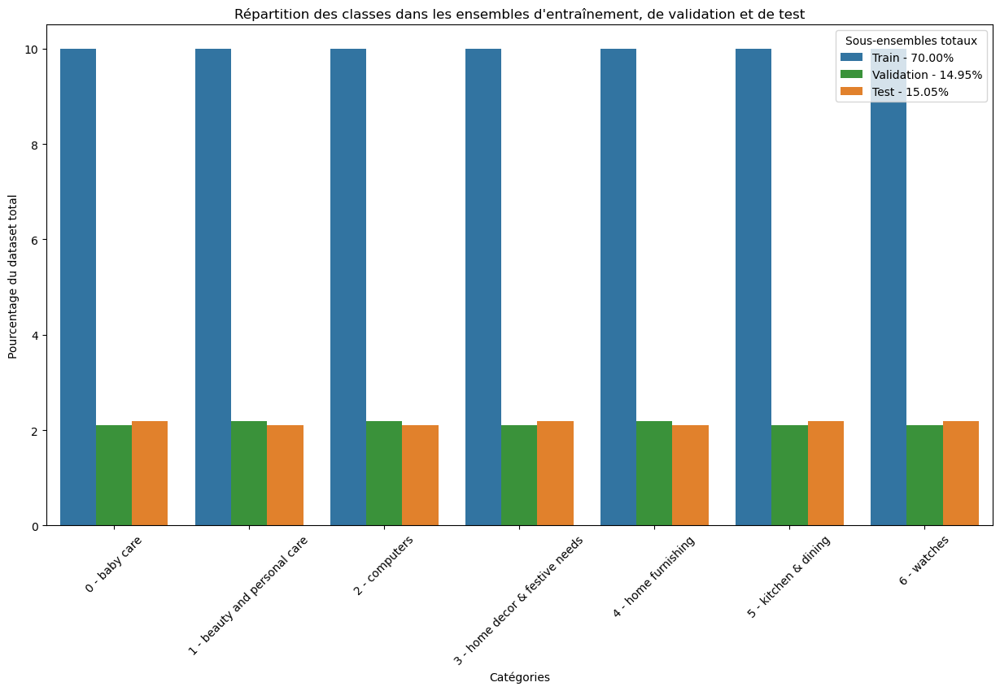

In [37]:
# s'assurer de la répartition équilibrée des classes dans les ensembles d'entraînement, de validation et de test

# labels des datasets
train_labels = extract_labels(train_dataset)
val_labels = extract_labels(val_dataset)
test_labels = extract_labels(test_dataset)

# répartition des classes
train_counts = np.unique(train_labels, return_counts=True)
val_counts = np.unique(val_labels, return_counts=True)
test_counts = np.unique(test_labels, return_counts=True)
total_counts = np.sum([train_counts[1], val_counts[1], test_counts[1]])

train_total_percentage = (np.sum(train_counts[1]) / total_counts) * 100
val_total_percentage = (np.sum(val_counts[1]) / total_counts) * 100
test_total_percentage = (np.sum(test_counts[1]) / total_counts) * 100

train_percentages = (train_counts[1] / total_counts) * 100
val_percentages = (val_counts[1] / total_counts) * 100
test_percentages = (test_counts[1] / total_counts) * 100

# correspondance avec les noms des catégories
categories = np.concatenate([train_counts[0], val_counts[0], test_counts[0]])
category_names = [f'{label} - {label_to_category[label]}' for label in categories]

data = {
    'Catégories': category_names,
    'Pourcentage': np.concatenate([train_percentages, val_percentages, test_percentages]),
    'Ensemble': ['Train'] * len(train_counts[0]) + ['Validation'] * len(val_counts[0]) + ['Test'] * len(test_counts[0])
}
df = pd.DataFrame(data)

palette = {'Train': '#1f77b4', 'Validation': '#2ca02c', 'Test': '#ff7f0e'}
plt.figure(figsize=(15, 8))
sns.barplot(x='Catégories', y='Pourcentage', hue='Ensemble', data=df, palette=palette)
plt.title('Répartition des classes dans les ensembles d\'entraînement, de validation et de test')
plt.xlabel('Catégories')
plt.ylabel('Pourcentage du dataset total')
plt.xticks(rotation=45)
handles, labels = plt.gca().get_legend_handles_labels()
labels = [
    f'Train - {train_total_percentage:.2f}%',
    f'Validation - {val_total_percentage:.2f}%',
    f'Test - {test_total_percentage:.2f}%'
]
plt.legend(handles=handles, labels=labels, title='Sous-ensembles totaux')
plt.show()

In [38]:
label_to_category

{0: 'baby care',
 1: 'beauty and personal care',
 2: 'computers',
 3: 'home decor & festive needs',
 4: 'home furnishing',
 5: 'kitchen & dining',
 6: 'watches'}

## Vérifier la reproductibilité

In [39]:
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_1 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 1:", random_values_1.numpy())
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_2 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 2:", random_values_2.numpy())
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "TF/KERAS Les valeurs aléatoires ne sont pas identiques"
print("TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

TF/KERAS Valeurs aléatoires 1: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Valeurs aléatoires 2: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.


## Liste des GPU

In [40]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]

## Entraînement DenseNet121 
* pré-entraînée AVEC les poids imagenet - SANS Data_augmentation

### Modèle

In [41]:
# couche d'entrée
input_tensor = tf.keras.layers.Input(shape=(img_height, img_width, 3))
# Desnet121 pré-entraîné sur ImageNet sans la couche de sortie initiale
base_model = DenseNet121(weights='imagenet', include_top=False, input_tensor=input_tensor)
# Geler les poids des couches du modèle de base (=transfert learning = préserve les connaissances issues des poids du modèle pré-entraîné)
for layer in base_model.layers:
    layer.trainable = False
    
# couches de sorties personnalisées
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output_tensor = tf.keras.layers.Dense(7, activation='softmax')(x)  # 7 classes

model = tf.keras.models.Model(inputs=input_tensor, outputs=output_tensor)

# paramètres d'entraînement
nb_epochs=25
es_patience=8
lr_patience=3
# visualisation du modèle
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 58,425,927 (222.88 MB)

 Trainable params: 51,388,423 (196.03 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [42]:
# compiler le modèle 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
metrics=['accuracy']
model.compile(optimizer=optimizer, loss=loss, metrics=metrics, jit_compile=False) 
# "just in time compiler" sur false pour option deterministe et garantir la reproductibilité cf: tf.config.experimental.enable_op_determinism()

In [43]:
# définition des callbacks : ajustements du processus d'entraînement sous certaines conditions
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=es_patience, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=lr_patience, min_lr=1e-4)


In [44]:
# entraînement
time1 = time.time()
history = model.fit(train_dataset, epochs=nb_epochs, validation_data=val_dataset, 
                    callbacks=[early_stopping, lr_scheduler])
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

Epoch 1/25


2025-01-22 14:51:58.736417: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


23/23 ━━━━━━━━━━━━━━━━━━━━ 26s 437ms/step - accuracy: 0.3819 - loss: 30.3458 - val_accuracy: 0.8025 - val_loss: 5.9829 - learning_rate: 0.0010
Epoch 2/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - accuracy: 0.8123 - loss: 3.8582 - val_accuracy: 0.8089 - val_loss: 4.8351 - learning_rate: 0.0010
Epoch 3/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - accuracy: 0.8685 - loss: 1.6265 - val_accuracy: 0.8471 - val_loss: 3.6647 - learning_rate: 0.0010
Epoch 4/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 206ms/step - accuracy: 0.9212 - loss: 0.6575 - val_accuracy: 0.8153 - val_loss: 3.6242 - learning_rate: 0.0010
Epoch 5/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9329 - loss: 0.5009 - val_accuracy: 0.8408 - val_loss: 3.0076 - learning_rate: 0.0010
Epoch 6/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 201ms/step - accuracy: 0.9440 - loss: 0.4078 - val_accuracy: 0.8408 - val_loss: 2.4041 - learning_rate: 0.0010
Epoch 7/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - accuracy: 0.9643 - loss: 0.1779 - val_accur

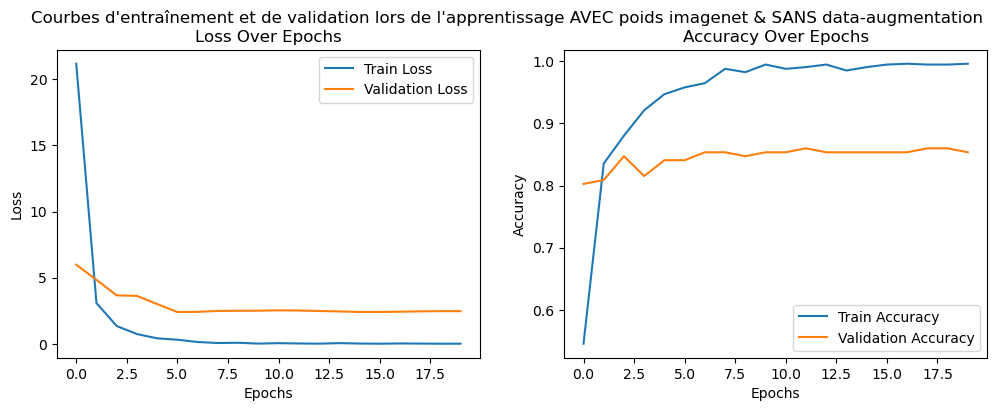

In [45]:
plt.figure(figsize=(12, 4))

# visualiser la perte pendant l'apprentissage
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# visualiser l'accuracy pendant l'apprentissage
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.suptitle("Courbes d'entraînement et de validation lors de l'apprentissage AVEC poids imagenet & SANS data-augmentation")
plt.show()

### Évaluation TRAIN

In [46]:
X_train, y_train, y_train_pred_classes = get_predictions(model, train_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


2025-01-22 14:55:00.549813: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [47]:
print("Classification Report  - TRAIN - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_train, y_train_pred_classes))

Classification Report  - TRAIN - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       105
           1       1.00      1.00      1.00       105
           2       1.00      1.00      1.00       105
           3       1.00      1.00      1.00       105
           4       1.00      1.00      1.00       105
           5       1.00      1.00      1.00       105
           6       1.00      1.00      1.00       105

    accuracy                           1.00       735
   macro avg       1.00      1.00      1.00       735
weighted avg       1.00      1.00      1.00       735



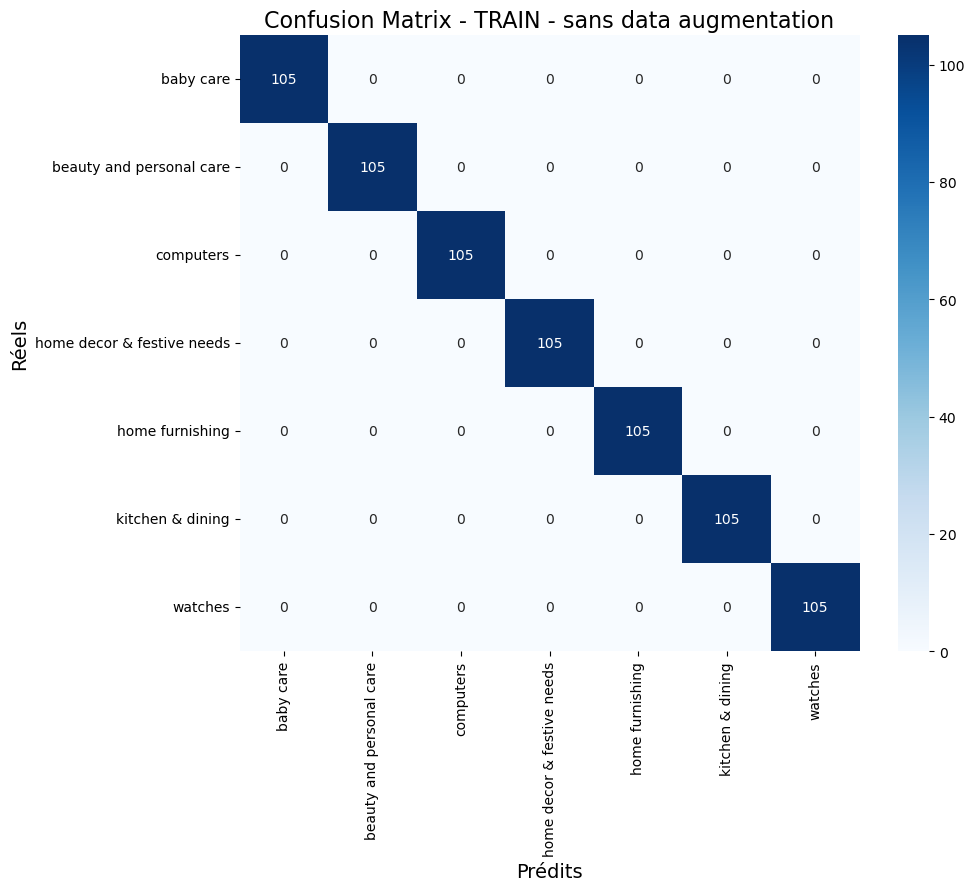

In [48]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN',  data_augment=False)

### Évaluation VALIDATION

In [49]:
X_val, y_val, y_val_pred_classes = get_predictions(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


2025-01-22 14:55:03.231596: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [50]:
print("Classification Report  - VALIDATION - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_val, y_val_pred_classes))

Classification Report  - VALIDATION - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.83      0.68      0.75        22
           1       0.77      0.87      0.82        23
           2       0.87      0.87      0.87        23
           3       0.76      0.86      0.81        22
           4       0.95      0.83      0.88        23
           5       0.91      0.91      0.91        22
           6       0.96      1.00      0.98        22

    accuracy                           0.86       157
   macro avg       0.86      0.86      0.86       157
weighted avg       0.86      0.86      0.86       157



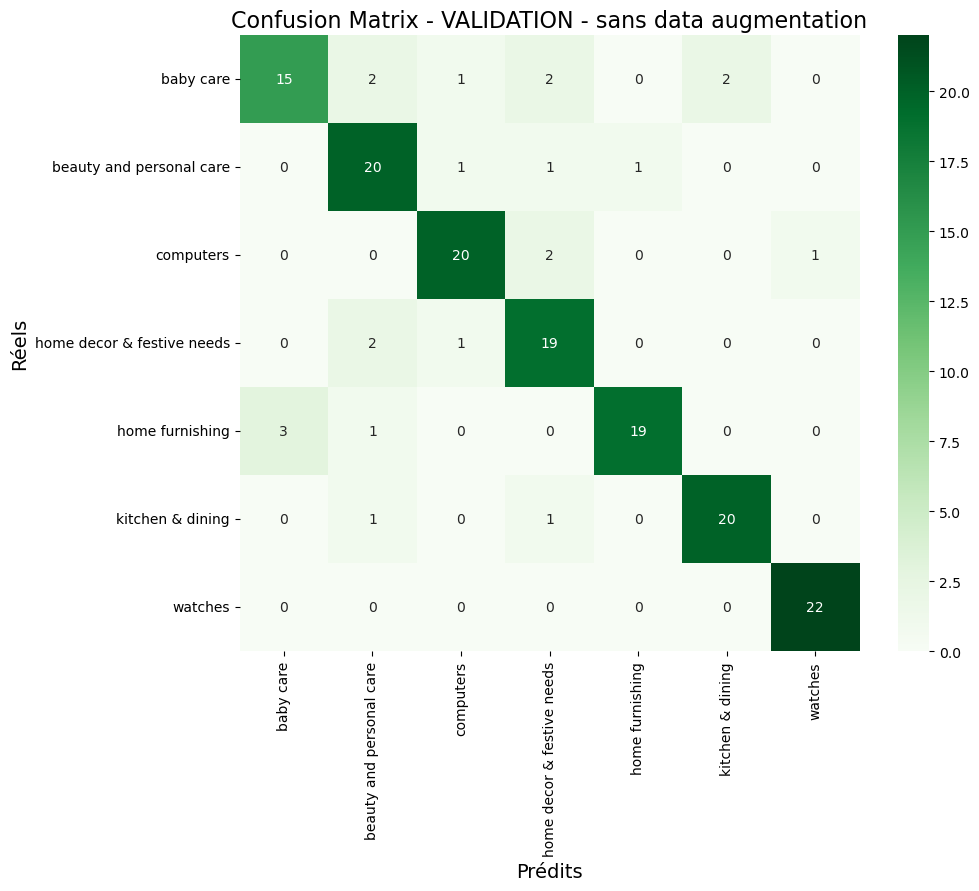

In [51]:
conf_matrix_val = confusion_matrix(y_val, y_val_pred_classes)
plot_confusion_matrix(conf_matrix_val, 'VALIDATION',  data_augment=False)

### Évaluation TRAIN+VALIDATION

In [52]:
train_val_dataset = train_dataset.concatenate(val_dataset)
loss_trainval, accuracy_trainval = model.evaluate(train_val_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - accuracy: 0.9965 - loss: 0.0652


In [53]:
X_train_val, y_train_val, y_train_val_pred_classes = get_predictions(model, train_val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-01-22 14:55:21.415885: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [54]:
print("Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & SANS data-augmentatio :")
print(classification_report(y_train_val, y_train_val_pred_classes))

Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & SANS data-augmentatio :
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       127
           1       0.95      0.98      0.97       128
           2       0.98      0.98      0.98       128
           3       0.95      0.98      0.96       127
           4       0.99      0.97      0.98       128
           5       0.98      0.98      0.98       127
           6       0.99      1.00      1.00       127

    accuracy                           0.98       892
   macro avg       0.98      0.98      0.98       892
weighted avg       0.98      0.98      0.98       892



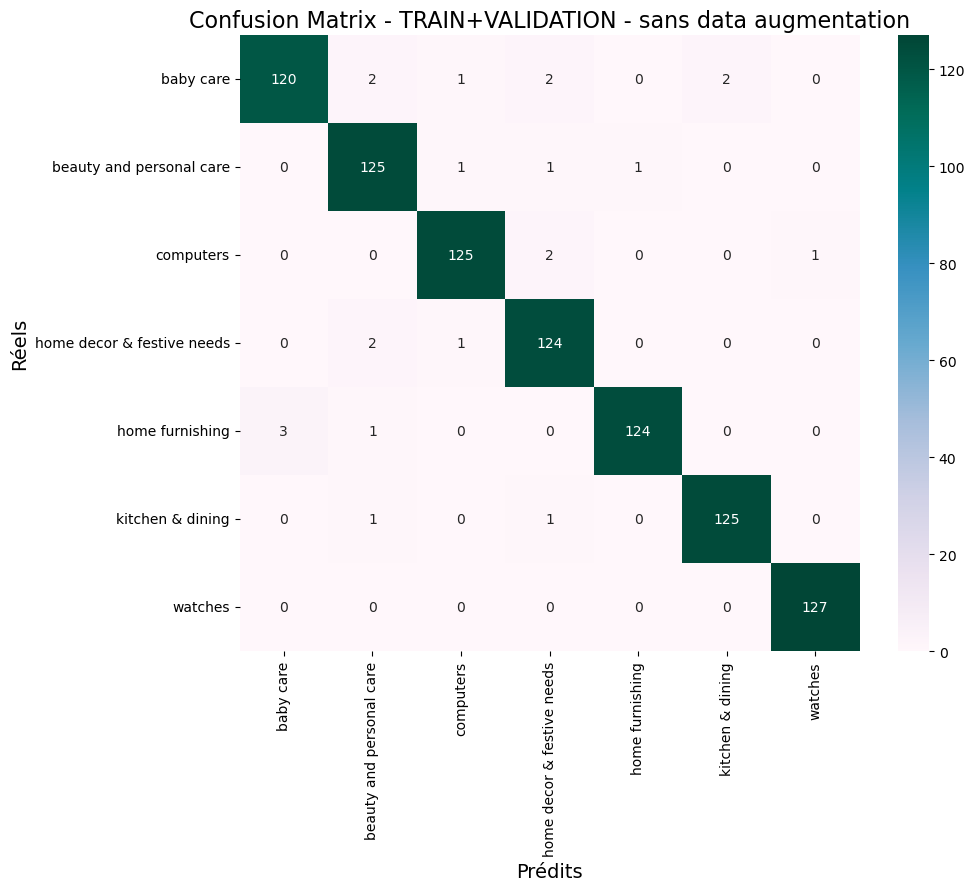

In [55]:
conf_matrix_train_val = confusion_matrix(y_train_val, y_train_val_pred_classes)
plot_confusion_matrix(conf_matrix_train_val, 'TRAIN+VALIDATION',  data_augment=False)

### Évaluation TEST

In [56]:
loss_test, accuracy_test = model.evaluate(test_dataset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - accuracy: 0.8987 - loss: 1.0929


In [57]:
X_test, y_test ,y_test_pred_classes = get_predictions(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


2025-01-22 14:55:26.220083: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [58]:
print("Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_test, y_test_pred_classes))

Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.89      0.74      0.81        23
           1       0.83      0.86      0.84        22
           2       0.88      0.95      0.91        22
           3       0.84      0.91      0.88        23
           4       0.82      0.82      0.82        22
           5       0.95      0.91      0.93        23
           6       1.00      1.00      1.00        23

    accuracy                           0.89       158
   macro avg       0.89      0.89      0.88       158
weighted avg       0.89      0.89      0.89       158



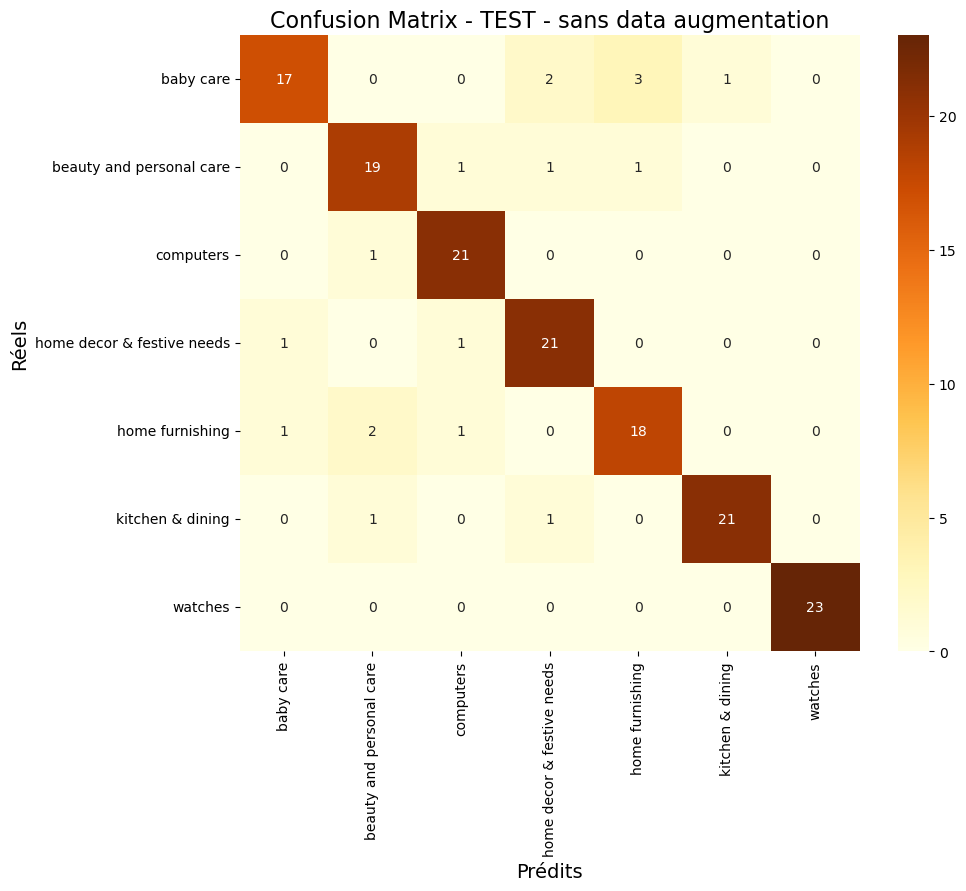

In [59]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST',  data_augment=False)

### Enregistrement des résultats

In [60]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['Baseline_DenseNet121'], 
                                                      'Description': ['AVEC poids imagenet & SANS data-augmentation'], 
                                                      'Accuracy_Train': [accuracy_trainval *100],
                                                      'Accuracy_Test': [accuracy_test *100], 
                                                      'Durée_totale_computation': [duration_str]})], ignore_index=True)
perf_test_df

/tmp/ipykernel_911805/1169499322.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['Baseline_DenseNet121'],


,Scenario,Description,Accuracy_Train,Accuracy_Test,Durée_totale_computation
0,Baseline_DenseNet121,AVEC poids imagenet & SANS data-augmentation,97.533631,88.607597,3 min 2 sec


### Visualisation des images bien et mal classées sur le TEST

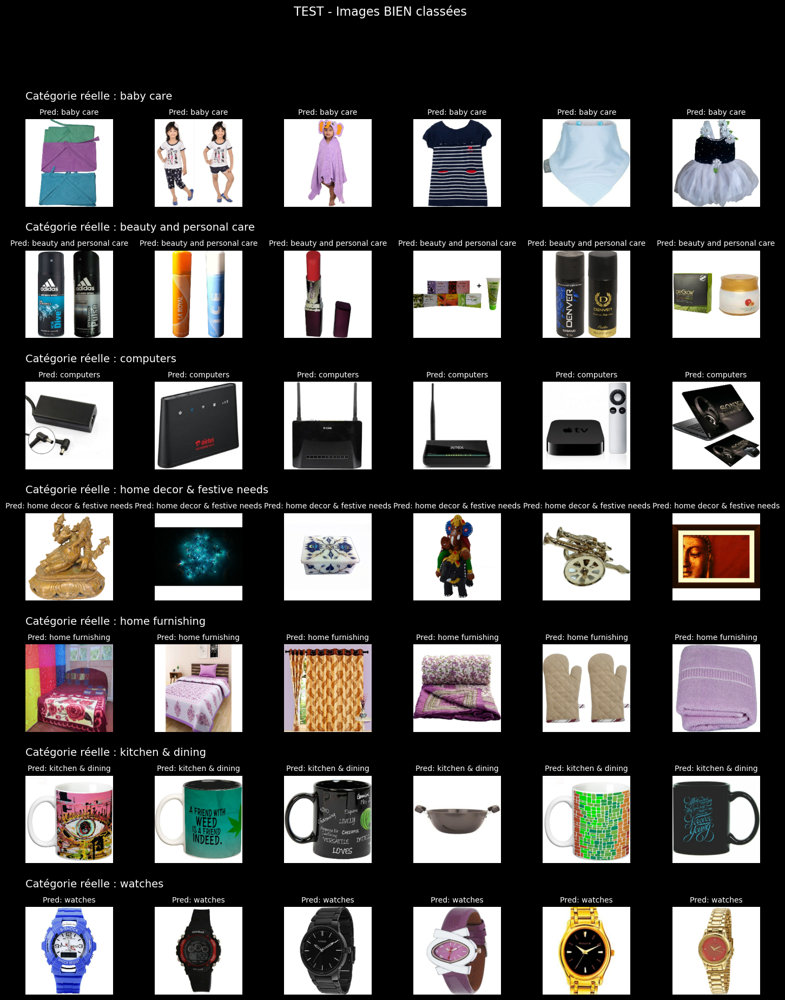

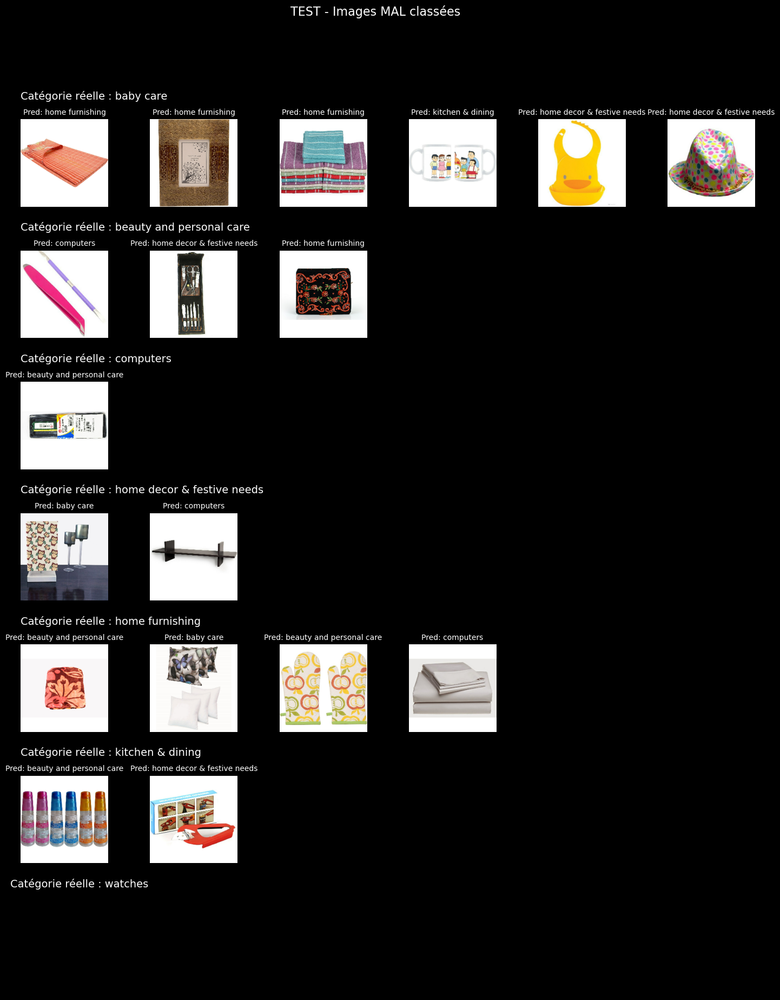

In [61]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)

# TEST - Approche Multimodale avec CLIP

**1. Données d'entraînement :**

*  400 millions d'images-textes collectées à partir d'Internet 
* Nom du dataset : WIT (WebImageText)

**2. Longueur de contexte d'entraînement :**

* Longueur de contexte : 77 tokens


**3. Détails des modèles :**
* Il existe plusieur modèles de computer vision disponibles avec CLIP, plusieurs ResNet et plusieurs Vision Transformers.
* Nous allons tester le modèle Vision Transformer (Base, 32x32 patches), le ViT-B/32.

Architecture : ResNet-50




## Imports librairies spécifiques

In [62]:
# data & science
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# system & tools
import time
import os
import random

# graphiques
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
from wordcloud import WordCloud
%matplotlib inline

# natural language processing
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer

# computer vision / CNN
from PIL import Image
import cv2 # OpenCV 

# approche CLIP
import torch
import clip

## Reproductibilité des résultats

In [63]:
# Seed value
seed_value= 1802

# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
os.environ['PYTHONHASHSEED']=str(seed_value)
print("os.environ['PYTHONHASHSEED'] == ", os.environ['PYTHONHASHSEED'])

# 2. Set the `python` built-in pseudo-random generator at a fixed value
random.seed(seed_value)

# 3. Set the `numpy` pseudo-random generator at a fixed value
np.random.seed(seed_value)

# 4. Set the `torch` pseudo-random generator at a fixed value
torch.manual_seed(seed_value)

# 5. If you are using CUDA, set the `torch.cuda` pseudo-random generator at a fixed value
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if you are using multi-GPU.

# 6. Configure PyTorch to use deterministic algorithms
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# 7. Vérifier la reproductibilité
random_values_1 = torch.rand(5)
print("PyTorch Valeurs aléatoires 1:", random_values_1.numpy())

## Réinitialiser les graines
torch.manual_seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if you are using multi-GPU.

random_values_2 = torch.rand(5)
print("PyTorch Valeurs aléatoires 2:", random_values_2.numpy())

## Vérifier que les valeurs aléatoires sont identiques
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "PyTorch Les valeurs aléatoires ne sont pas identiques"
print("PyTorch : Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

os.environ['PYTHONHASHSEED'] ==  1802
PyTorch Valeurs aléatoires 1: [0.70822376 0.91128254 0.52850455 0.03241813 0.45658195]
PyTorch Valeurs aléatoires 2: [0.70822376 0.91128254 0.52850455 0.03241813 0.45658195]
PyTorch : Les valeurs aléatoires sont identiques, la graine est correctement fixée.


In [64]:
torch.cuda.memory_summary(device=None, abbreviated=True)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |\n|---------------------------------------------------------------------------|\n| Requested memory      |      0 B   |      0 B   |      0 B   |      0 B   |\n|--------------------------------------------------

In [65]:
torch.cuda.empty_cache()

## Charger le modèle CLIP et le tokenizer associés.

In [66]:
torch.cuda.device_count()

4

In [67]:
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

In [68]:
# Charger le modèle CLIP et le tokenizer
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

## Vérifier la reproductibilité

In [69]:
torch.manual_seed(seed_value)
random_values_1 = torch.rand(5)
print("PyTorch Valeurs aléatoires 1:", random_values_1.numpy())

## Réinitialiser les graines
torch.manual_seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if you are using multi-GPU.

random_values_2 = torch.rand(5)
print("PyTorch Valeurs aléatoires 2:", random_values_2.numpy())

## Vérifier que les valeurs aléatoires sont identiques
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "PyTorch Les valeurs aléatoires ne sont pas identiques"
print("PyTorch : Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

PyTorch Valeurs aléatoires 1: [0.70822376 0.91128254 0.52850455 0.03241813 0.45658195]
PyTorch Valeurs aléatoires 2: [0.70822376 0.91128254 0.52850455 0.03241813 0.45658195]
PyTorch : Les valeurs aléatoires sont identiques, la graine est correctement fixée.


## Fonctions

In [70]:
#visualiser les images bien et mal classées sur le TEST
def visualisation_images_TEST(etat, y_test, y_test_pred_classes, data_final, test_indices, dict_label, num_examples=6):
    categories = np.unique(y_test)

    # Récupérer les index des images bien et mal classées
    if etat == 'BIEN':
        indices = np.where(y_test_pred_classes == y_test.values)[0]
        title = "TEST - Images BIEN classées"
    elif etat == 'MAL':
        indices = np.where(y_test_pred_classes != y_test.values)[0]
        title = "TEST - Images MAL classées"
    else:
        raise ValueError("L'état doit être 'BIEN' ou 'MAL'")

    # Init dict des exemples
    examples = {category: [] for category in categories}
    # Récupérer les exemples par catégories
    for category in categories:
        category_indices = [idx for idx in indices if y_test.iloc[idx] == category]
        if len(category_indices) >= num_examples:
            examples[category] = category_indices[:num_examples]
        else:
            examples[category] = category_indices

    # Affichage des exemples par catégories
    fig, axes = plt.subplots(len(categories), num_examples, figsize=(num_examples * 3, len(categories) * 3), facecolor='black')
    fig.suptitle(title, color='white', fontsize=16)

    plt.subplots_adjust(hspace=0.5)

    for i, category in enumerate(categories):
        axes[i, 0].annotate(f'Catégorie réelle : {dict_label[category]}', xy=(0, 1), xytext=(0, 1.2),
                            xycoords='axes fraction', textcoords='axes fraction',
                            ha='left', va='bottom', color='white', fontsize=14, annotation_clip=False)

        for j in range(num_examples):
            if j < len(examples[category]):
                idx = examples[category][j]
                original_idx = test_indices[idx]
                image_path = data_final.iloc[original_idx]['reshaped_image_path']
                try:
                    rescaled_image = Image.open(image_path)
                    axes[i, j].imshow(rescaled_image)
                    pred_label = dict_label[y_test_pred_classes[idx]]
                    axes[i, j].set_title(f"Pred: {pred_label}", color='white', fontsize=10)
                except Exception as e:
                    print(f"Erreur lors de l'ouverture de l'image {image_path}: {e}")
            axes[i, j].axis('off')

    plt.show()

    
# Fonction pour obtenir les prédictions du modèle sur un dataset donné
def get_predictions(model, X):
    y_pred = model.predict(X)
    return y_pred

# Fonction pour vérifier la répartition équilibrée des classes après le train_test_split
def check_class_distribution(y_train, y_test, label_to_category):
    # Fonction pour extraire les labels
    def extract_labels(labels):
        return np.array(labels)

    # Labels des datasets
    train_labels = extract_labels(y_train)
    test_labels = extract_labels(y_test)

    # Répartition des classes
    train_counts = np.unique(train_labels, return_counts=True)
    test_counts = np.unique(test_labels, return_counts=True)
    total_counts = np.sum([train_counts[1], test_counts[1]])

    train_total_percentage = (np.sum(train_counts[1]) / total_counts) * 100
    test_total_percentage = (np.sum(test_counts[1]) / total_counts) * 100

    train_percentages = (train_counts[1] / total_counts) * 100
    test_percentages = (test_counts[1] / total_counts) * 100

    # Correspondance avec les noms des catégories
    categories = np.concatenate([train_counts[0], test_counts[0]])
    category_names = [label_to_category[label] for label in categories]

    data = {
        'Catégories': category_names,
        'Pourcentage': np.concatenate([train_percentages, test_percentages]),
        'Ensemble': ['Train'] * len(train_counts[0]) + ['Test'] * len(test_counts[0])
    }
    df_plot = pd.DataFrame(data)

    palette = {'Train': '#1f77b4', 'Test': '#ff7f0e'}
    plt.figure(figsize=(15, 8))
    sns.barplot(x='Catégories', y='Pourcentage', hue='Ensemble', data=df_plot, palette=palette)
    plt.title('Répartition des classes dans les ensembles d\'entraînement et de test')
    plt.xlabel('Catégories')
    plt.ylabel('Pourcentage du dataset total')
    plt.xticks(rotation=45)
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = [
        f'Train - {train_total_percentage:.2f}%',
        f'Test - {test_total_percentage:.2f}%'
    ]
    plt.legend(handles=handles, labels=labels, title='Sous-ensembles totaux')
    plt.show()

## A. Approche 1 : Avec les descriptions originelles (non tokenisées)

### Encoder les images et les descriptions

In [71]:
data_final.head(2)

,uniq_id,product_name,description,token_nltk,categ_0,label,reshaped_image_path
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Key Features of Elegance Polyester Multicolor ...,home furnishing,4,./reshaped_images/55b85ea15a1536d46b7190ad6fff...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Specifications of Sathiyas Cotton Bath Towel B...,baby care,0,./reshaped_images/7b72c92c2f6c40268628ec5f14c6...


In [72]:
time1 = time.time()

In [73]:
# Prétraiter les images et les descriptions
images = [preprocess(Image.open(image_path)) for image_path in data_final['reshaped_image_path']]


/home/stephanie/miniconda3/envs/env_p6_gpu/lib/python3.11/site-packages/PIL/Image.py:3218: DecompressionBombWarning: Image size (121925764 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [74]:
# le modèle CLIP a été pré-entraîné avec une longueur de contexte spécifique (77 tokens pour le modèle ViT-B/32), 
# et changer cette longueur peut affecter les performances du modèle.
max_length = 77
model.context_length = max_length
#texts = clip.tokenize(data_final['token_nltk'].tolist()).to(device)
texts = clip.tokenize(data_final['description'], context_length=model.context_length, truncate=True).squeeze(0)


In [75]:
texts[0]

tensor([49406,  1458,  4643,   539, 19146, 38514, 21683, 29245, 10197,  5034,
         1094,  2489, 17223, 10732, 17223,   267, 19146, 38514, 21683, 29245,
        10197,  5034,  1094,  2489, 17223,   263,   273,   272,   274,  3741,
          530, 10788,   267,  3420,   539,   273,   264,  2827,   281,  1724,
          269,   279,   280,   280,   589, 17223, 38259,   518,  1012,   539,
          518, 14836,   269,   589, 17223,   533,  1105,   633,   272,   271,
          271,   260,  1400,  3027, 38514, 10033,   269,   585,  4643,   550,
         5034,  1094,  1844, 14771,   593,  4044, 49407], dtype=torch.int32)

In [76]:
# Empiler les images en un seul tenseur
image_input = torch.stack(images).to(device)

# Encoder les images et les descriptions
with torch.no_grad():
    image_features = model.encode_image(image_input)
    text_features = model.encode_text(texts)

# Normaliser les caractéristiques
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)

### Combiner les caractéristiques des images et des textes
Combinez les caractéristiques encodées des images et des textes pour former une représentation conjointe.

In [77]:
# Combiner les caractéristiques des images et des textes
#pour cpu
combined_features = torch.cat((image_features, text_features), dim=1).cpu().numpy() 
# # pour gpu
# image_features = image_features.to(device)
# text_features = text_features.to(device)
# # Combiner les caractéristiques des images et des textes sur le GPU
# combined_features = torch.cat((image_features, text_features), dim=1)

### Train-Test Split

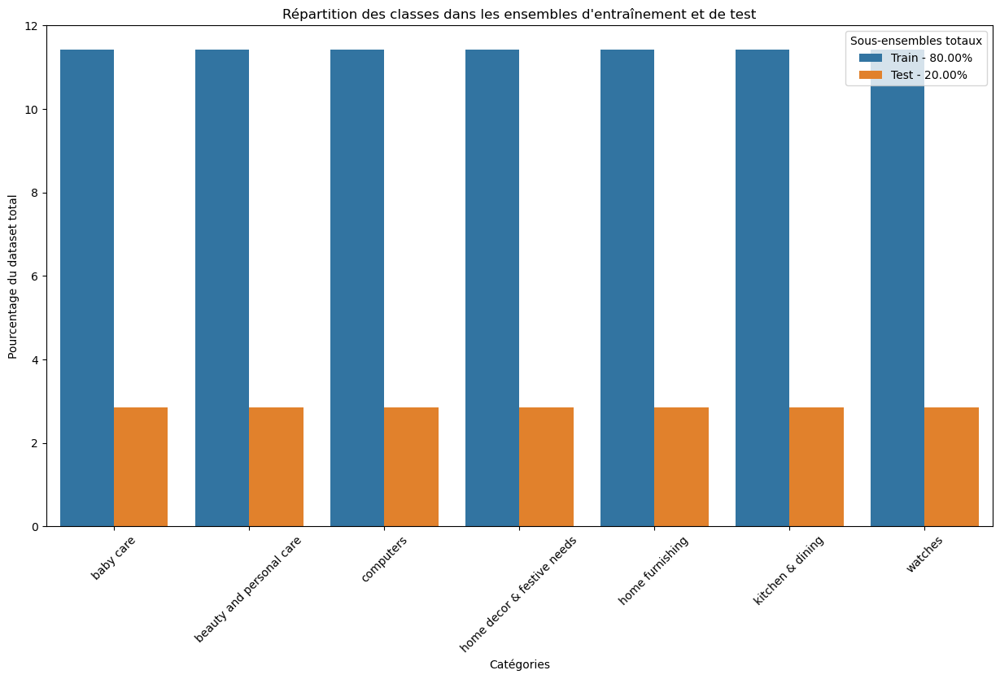

In [78]:
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test, train_indices, test_indices = train_test_split(
    combined_features, data_final['label'], data_final.index, 
    test_size=0.2, stratify=data_final['label'], random_state=seed_value)
# Vérifier la répartition des classes
check_class_distribution(y_train, y_test, label_to_category)

### Entraîner un classificateur
Utilisez les caractéristiques combinées pour entraîner un classificateur, comme une régression logistique.

In [79]:
# Entraîner un classificateur
classifier = LogisticRegression(max_iter=1000)
classifier.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [80]:
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

### Évaluer le classificateur


In [81]:
print("Score d'entraînement :", classifier.score(X_train, y_train))
print("Score de test :", classifier.score(X_test, y_test))

Score d'entraînement : 0.9654761904761905
Score de test : 0.9666666666666667


#### **TRAiN**

In [82]:
y_train_pred_classes = get_predictions(classifier, X_train)
target_names = [label_to_category[label] for label in sorted(label_to_category)]
print(classification_report(y_train, y_train_pred_classes, target_names=target_names))

                            precision    recall  f1-score   support

                 baby care       0.96      0.86      0.91       120
  beauty and personal care       0.97      0.94      0.95       120
                 computers       0.98      1.00      0.99       120
home decor & festive needs       0.95      0.97      0.96       120
           home furnishing       0.92      0.98      0.95       120
          kitchen & dining       0.98      1.00      0.99       120
                   watches       1.00      1.00      1.00       120

                  accuracy                           0.97       840
                 macro avg       0.97      0.97      0.97       840
              weighted avg       0.97      0.97      0.97       840



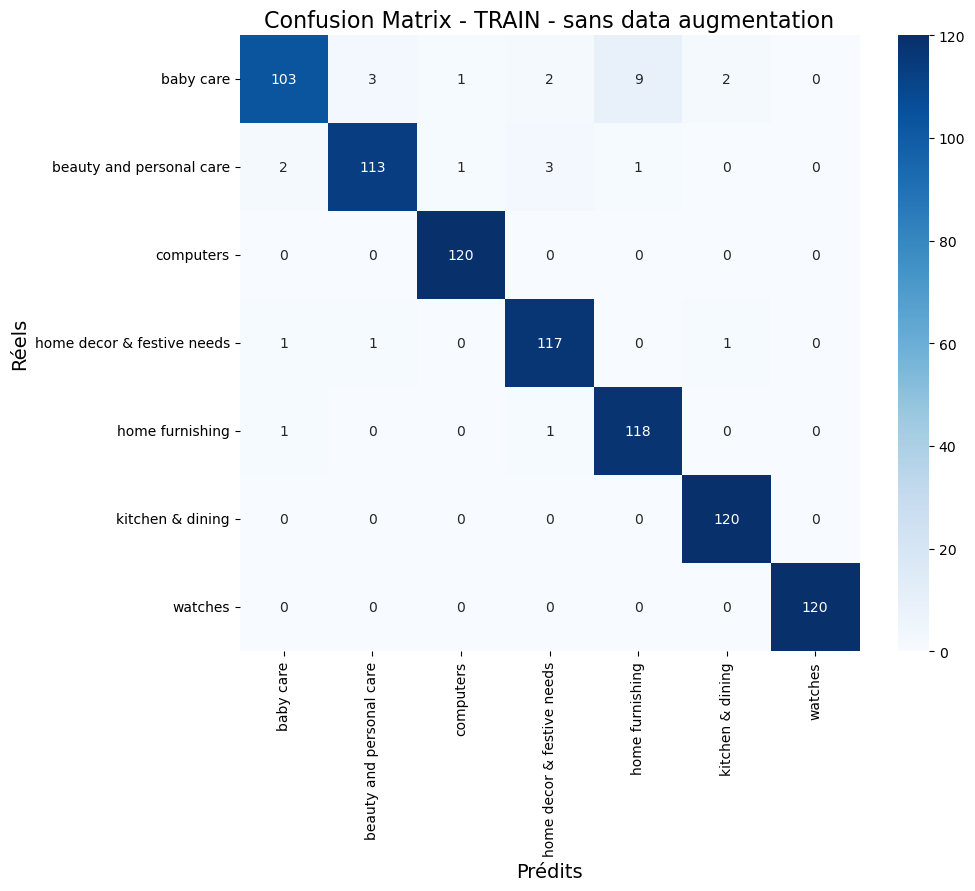

In [83]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN')

#### **TEST**

In [84]:
y_test_pred_classes = get_predictions(classifier, X_test)
target_names = [label_to_category[label] for label in sorted(label_to_category)]
print(classification_report(y_test, y_test_pred_classes, target_names=target_names))

                            precision    recall  f1-score   support

                 baby care       0.97      0.97      0.97        30
  beauty and personal care       1.00      0.83      0.91        30
                 computers       0.94      1.00      0.97        30
home decor & festive needs       0.88      1.00      0.94        30
           home furnishing       1.00      1.00      1.00        30
          kitchen & dining       1.00      0.97      0.98        30
                   watches       1.00      1.00      1.00        30

                  accuracy                           0.97       210
                 macro avg       0.97      0.97      0.97       210
              weighted avg       0.97      0.97      0.97       210



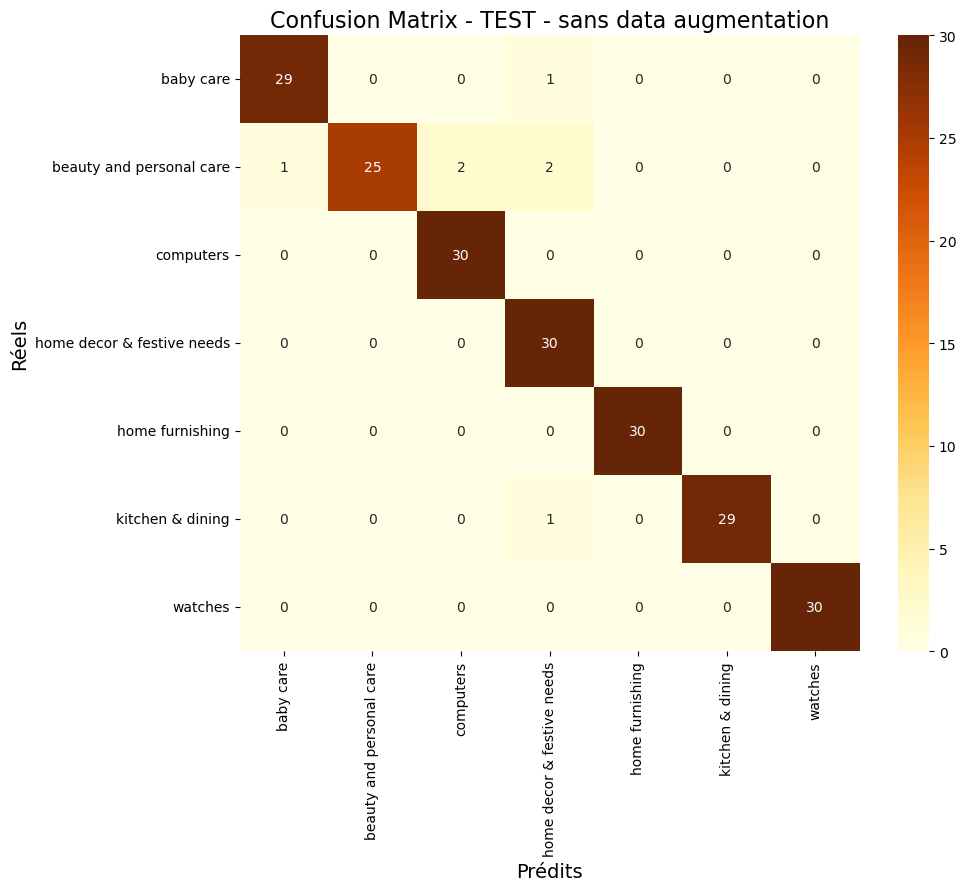

In [85]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST')

### Enregistrement des résultats

In [86]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['TEST_CLIP_model_A'], 
                                                      'Description': ['SANS tokenisation NLTK et troncature avec CLIP / CPU'], 
                                                      'Accuracy_Train': [classifier.score(X_train, y_train) *100],
                                                      'Accuracy_Test': [classifier.score(X_test, y_test) *100], 
                                                      'Durée_totale_computation': [duration_str]})], ignore_index=True)
perf_test_df

,Scenario,Description,Accuracy_Train,Accuracy_Test,Durée_totale_computation
0,Baseline_DenseNet121,AVEC poids imagenet & SANS data-augmentation,97.533631,88.607597,3 min 2 sec
1,TEST_CLIP_model_A,SANS tokenisation NLTK et troncature avec CLIP...,96.547619,96.666667,2 min 40 sec


### Visualisation des images bien et mal classées sur le TEST

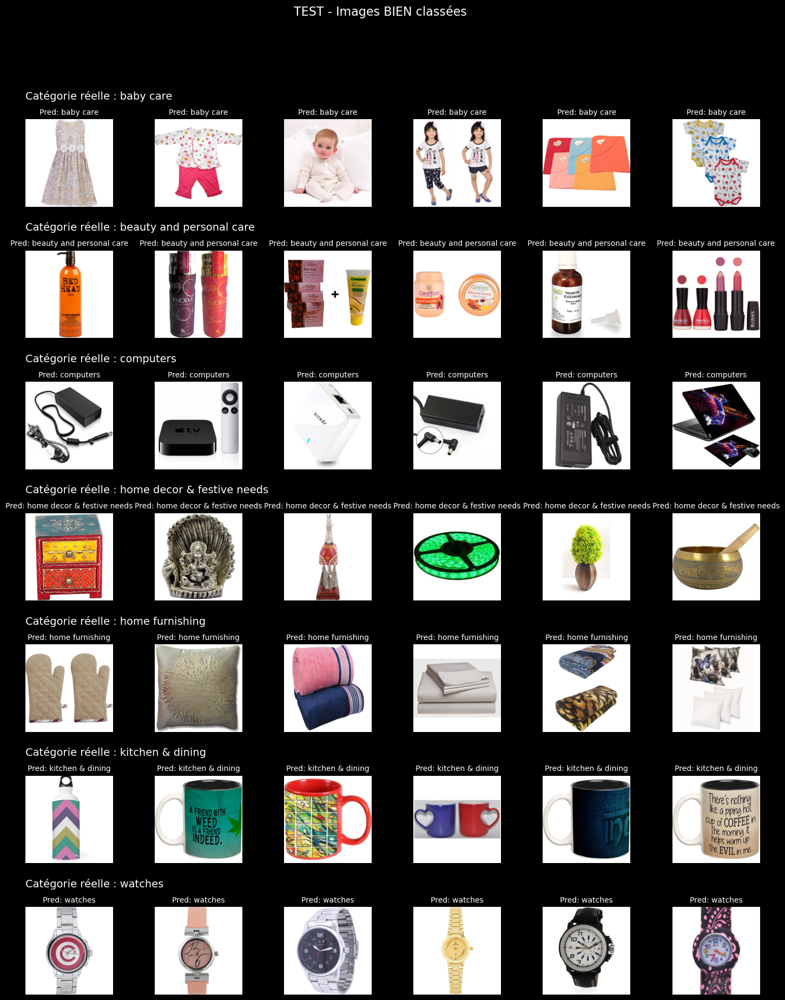

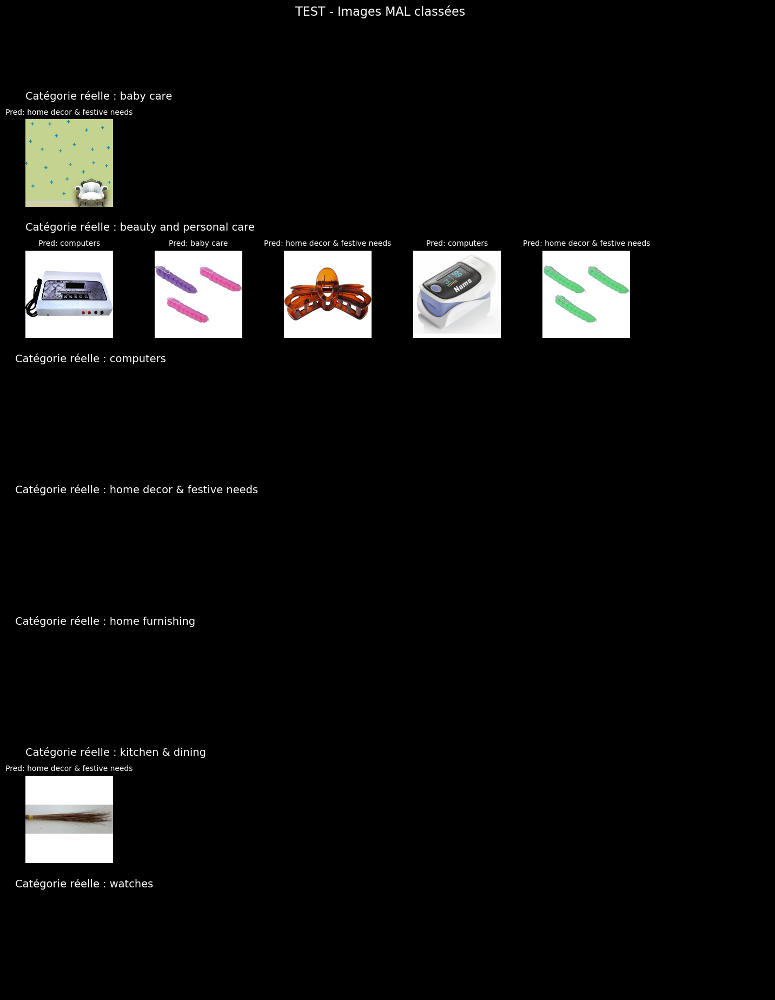

In [87]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, data_final, test_indices, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, data_final, test_indices, dict_label=label_to_category, num_examples=6)


## B. Approche 2 : Avec les descriptions issues d'une tokenisation nltk

### Encoder les images et les descriptions

In [88]:
time1 = time.time()

In [89]:
# Prétraiter les images et les descriptions
images = [preprocess(Image.open(image_path)) for image_path in data_final['reshaped_image_path']]


/home/stephanie/miniconda3/envs/env_p6_gpu/lib/python3.11/site-packages/PIL/Image.py:3218: DecompressionBombWarning: Image size (121925764 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [90]:
# le modèle CLIP a été pré-entraîné avec une longueur de contexte spécifique (77 tokens pour le modèle ViT-B/32), 
# et changer cette longueur peut affecter les performances du modèle.
max_length = 77
model.context_length = max_length
#texts = clip.tokenize(data_final['token_nltk'].tolist()).to(device)
texts = clip.tokenize(data_final['token_nltk'], context_length=model.context_length, truncate=True).squeeze(0)


In [91]:
texts[0]

tensor([49406,  1458,  4643,   539, 19146, 38514, 21683, 29245, 10197,  5034,
         1094,  2489, 17223, 10732, 17223, 19146, 38514, 21683, 29245, 10197,
         5034,  1094,  2489, 17223,  3741,   530, 10788,  3420,   539,  2827,
         1724,   589, 17223, 38259,   518,  1012,   539,   518, 14836,   589,
        17223,   533,  1105,   633,  1400,  3027, 38514, 10033,   585,  4643,
          550,  5034,  1094,  1844, 14771,   593,  4044,  2540,   585,  2088,
          518,  1530,  5501,  8821,   537,  3721,   589, 17223,   533,   773,
        46642,   537,  3564, 10118,  4547,   805, 49407], dtype=torch.int32)

In [92]:
# Empiler les images en un seul tenseur
image_input = torch.stack(images).to(device)

# Encoder les images et les descriptions
with torch.no_grad():
    image_features = model.encode_image(image_input)
    text_features = model.encode_text(texts)

# Normaliser les caractéristiques
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)

### Combiner les caractéristiques des images et des textes
Combinez les caractéristiques encodées des images et des textes pour former une représentation conjointe.

In [93]:
# Combiner les caractéristiques des images et des textes
combined_features = torch.cat((image_features, text_features), dim=1).cpu().numpy()

### Entraîner un classificateur
Utilisez les caractéristiques combinées pour entraîner un classificateur, comme une régression logistique.

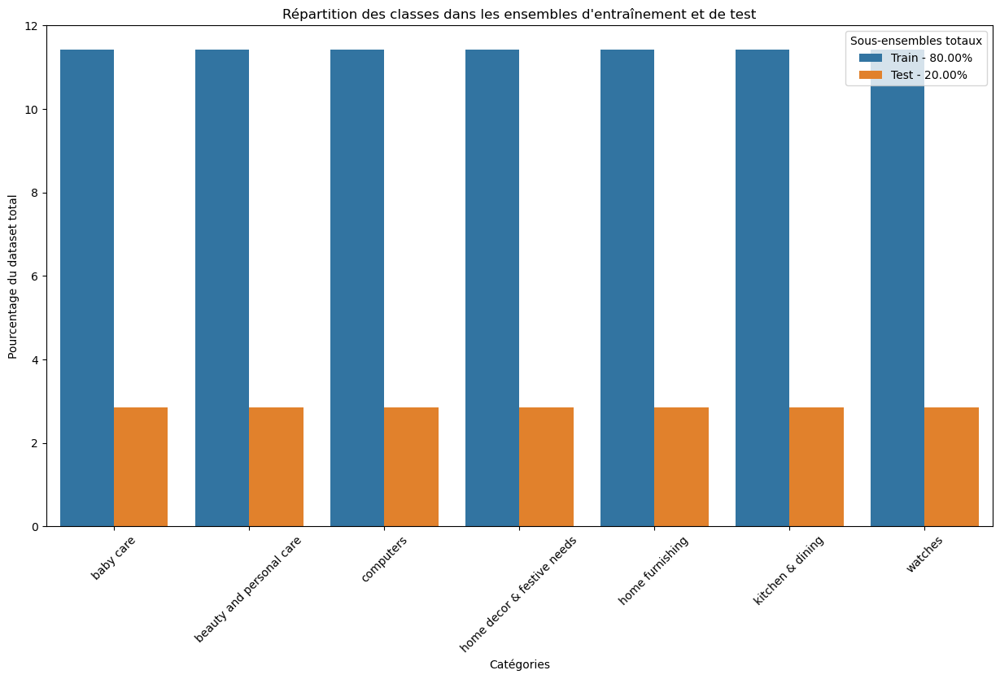

In [94]:
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test, train_indices, test_indices = train_test_split(
    combined_features, data_final['label'], data_final.index, 
    test_size=0.2, stratify=data_final['label'], random_state=seed_value)
# Vérifier la répartition des classes
check_class_distribution(y_train, y_test, label_to_category)

In [95]:
# Entraîner un classificateur
classifier = LogisticRegression(max_iter=1000)
classifier.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [96]:
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

### Évaluer le classificateur


In [97]:
print("Score d'entraînement :", classifier.score(X_train, y_train))
print("Score de test :", classifier.score(X_test, y_test))

Score d'entraînement : 0.9583333333333334
Score de test : 0.9571428571428572


#### **TRAiN**

In [98]:
y_train_pred_classes = get_predictions(classifier, X_train)
target_names = [label_to_category[label] for label in sorted(label_to_category)]
print(classification_report(y_train, y_train_pred_classes, target_names=target_names))

                            precision    recall  f1-score   support

                 baby care       0.95      0.85      0.90       120
  beauty and personal care       0.97      0.93      0.94       120
                 computers       0.98      1.00      0.99       120
home decor & festive needs       0.94      0.97      0.95       120
           home furnishing       0.91      0.97      0.94       120
          kitchen & dining       0.97      1.00      0.98       120
                   watches       1.00      0.99      1.00       120

                  accuracy                           0.96       840
                 macro avg       0.96      0.96      0.96       840
              weighted avg       0.96      0.96      0.96       840



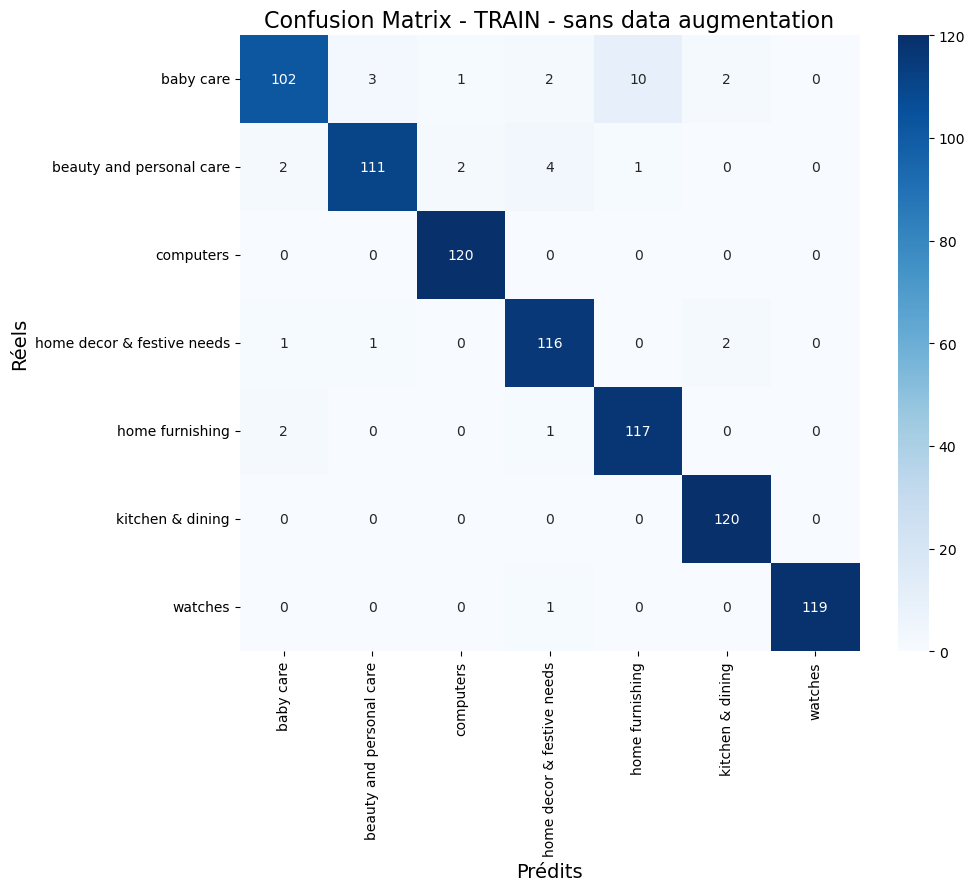

In [99]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN')

#### **TEST**

In [100]:
y_test_pred_classes = get_predictions(classifier, X_test)
target_names = [label_to_category[label] for label in sorted(label_to_category)]
print(classification_report(y_test, y_test_pred_classes, target_names=target_names))

                            precision    recall  f1-score   support

                 baby care       0.97      0.97      0.97        30
  beauty and personal care       0.96      0.83      0.89        30
                 computers       0.91      1.00      0.95        30
home decor & festive needs       0.88      0.93      0.90        30
           home furnishing       1.00      1.00      1.00        30
          kitchen & dining       1.00      0.97      0.98        30
                   watches       1.00      1.00      1.00        30

                  accuracy                           0.96       210
                 macro avg       0.96      0.96      0.96       210
              weighted avg       0.96      0.96      0.96       210



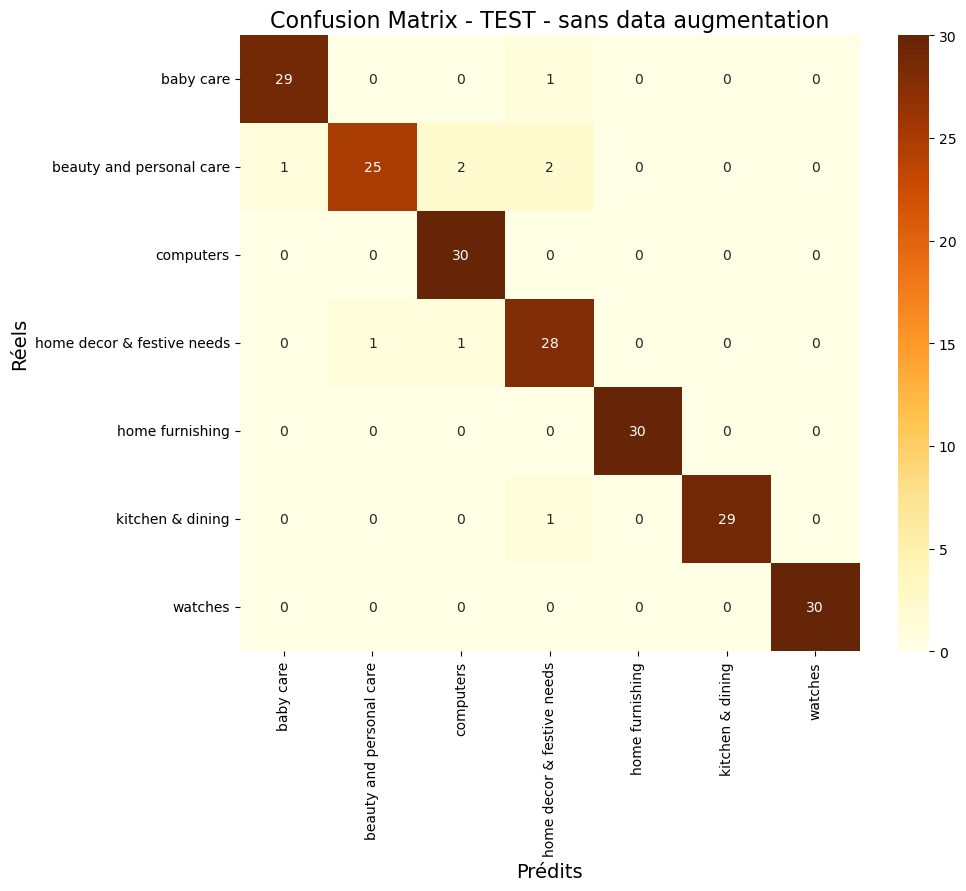

In [101]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST')

### Enregistrement des résultats

In [102]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['TEST_CLIP_model_B'], 
                                                      'Description': ['AVEC tokenisation NLTK et troncature avec CLIP'], 
                                                      'Accuracy_Train': [classifier.score(X_train, y_train) *100],
                                                      'Accuracy_Test': [classifier.score(X_test, y_test) *100], 
                                                      'Durée_totale_computation': [duration_str]})], ignore_index=True)
perf_test_df

,Scenario,Description,Accuracy_Train,Accuracy_Test,Durée_totale_computation
0,Baseline_DenseNet121,AVEC poids imagenet & SANS data-augmentation,97.533631,88.607597,3 min 2 sec
1,TEST_CLIP_model_A,SANS tokenisation NLTK et troncature avec CLIP...,96.547619,96.666667,2 min 40 sec
2,TEST_CLIP_model_B,AVEC tokenisation NLTK et troncature avec CLIP,95.833333,95.714286,2 min 41 sec


### Visualisation des images bien et mal classées sur le TEST

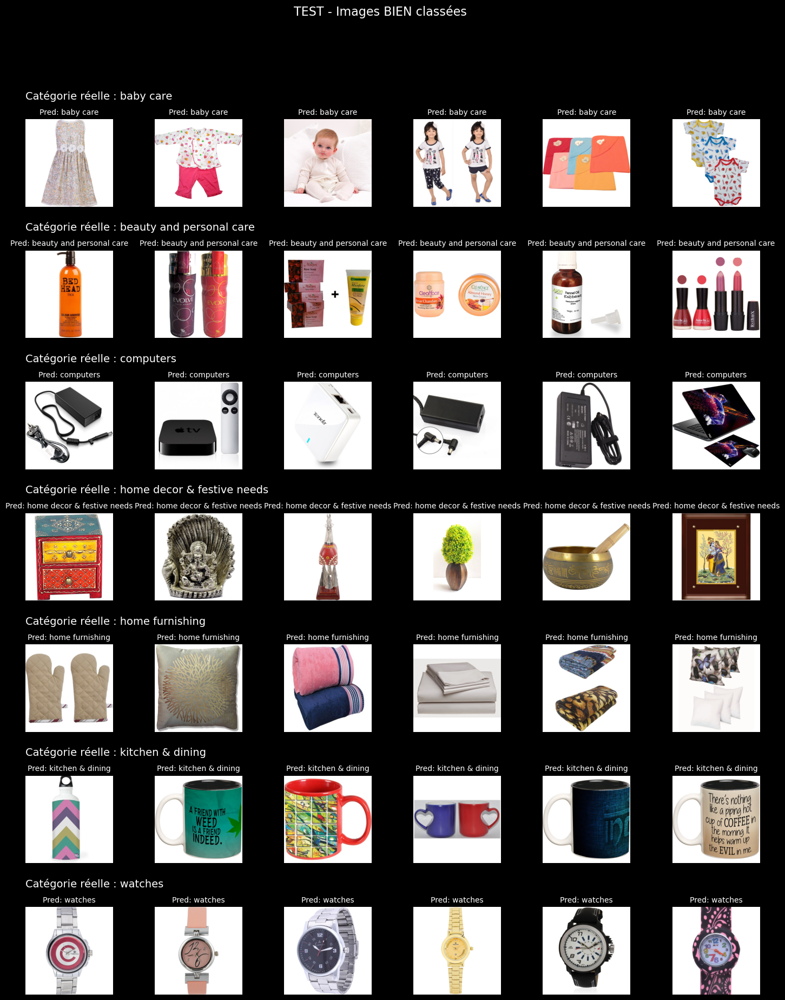

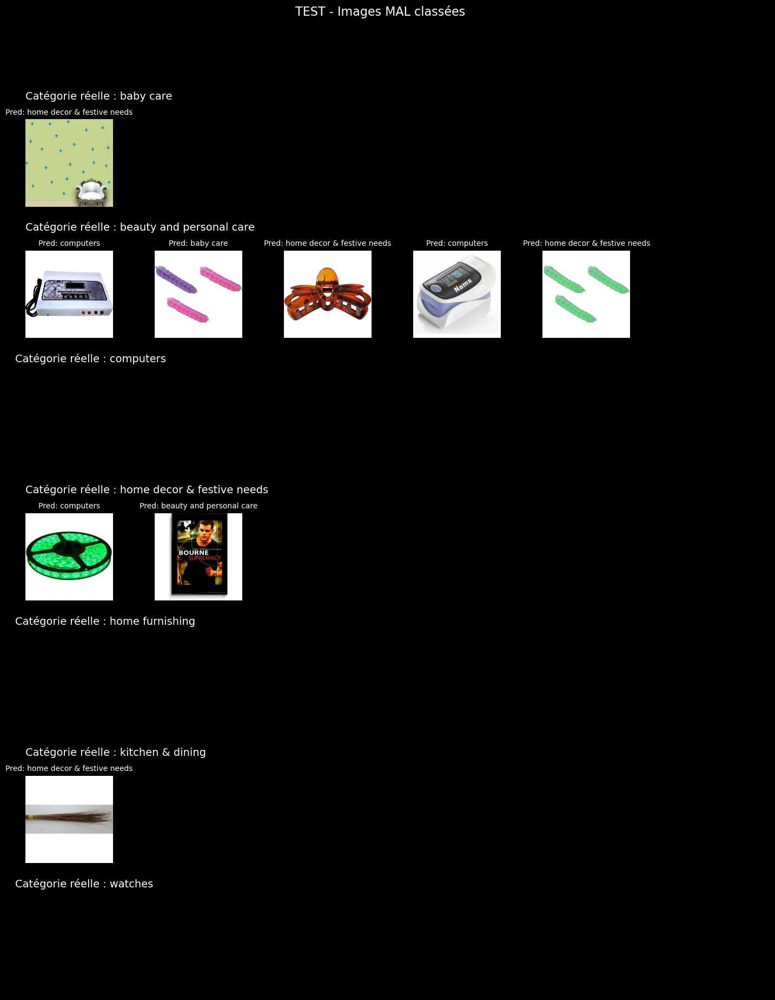

In [103]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, data_final, test_indices, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, data_final, test_indices, dict_label=label_to_category, num_examples=6)

In [104]:
perf_test_df

,Scenario,Description,Accuracy_Train,Accuracy_Test,Durée_totale_computation
0,Baseline_DenseNet121,AVEC poids imagenet & SANS data-augmentation,97.533631,88.607597,3 min 2 sec
1,TEST_CLIP_model_A,SANS tokenisation NLTK et troncature avec CLIP...,96.547619,96.666667,2 min 40 sec
2,TEST_CLIP_model_B,AVEC tokenisation NLTK et troncature avec CLIP,95.833333,95.714286,2 min 41 sec


# CONCLUSIONS

**RAPPEL SCORE DU MEILLEUR DENSENET**



**CONCLUSION MODÈLES CLIP** MEILLEUR SANS TOKENISATION NLTK

* MOINS COUTEUX QUE DENSENT SANS GPU